In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random as rn
from scipy.stats import gaussian_kde


# Основы

## Генеральная совокупность

Генеральная совокупность ГС - множество объектов относительно которого мы делаем выводы

Репрезентативность выборки - как хорошо мы аппроксимируем выводы относительно ГС по выборке

Выборки - случайная, стратифицированная (сначала делим ГС на несколько кластеров и потом как случайная только относительно страт), групповая выборка (делим ГС на несколько похожих кластеров) - выбираем слчайно кластеры и потом случайно из кластеров

## Типы переменных

Количественные - Непрерывные, дискретные

Качественные - Делим на группы 

Ранговые - можно сравнить результат но не более

## Меры центральной тенденции

### Понятия описательной статистики

Гистограмма частот

Мода (самое частовстречающееся) , медиана Мс (делит пополам множество), среднее значение Х с чертой

X с чертой - среднее выборки

### Выбор меры центральной тенденции



### Свойства среднего

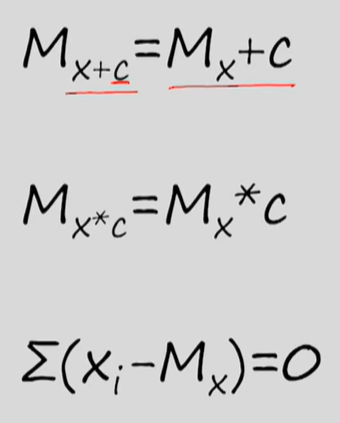

Последнее - отколение от среднего

(count     250.000000
 mean      131.415462
 std       534.442167
 min     -1201.146668
 25%      -227.838780
 50%       154.501167
 75%       502.574257
 max      2111.875881
 dtype: float64,
 0     -1201.146668
 1     -1184.181935
 2     -1138.492965
 3      -966.027515
 4      -958.495310
           ...     
 245    1216.665297
 246    1333.825096
 247    1336.696209
 248    1387.196125
 249    2111.875881
 Length: 250, dtype: float64)

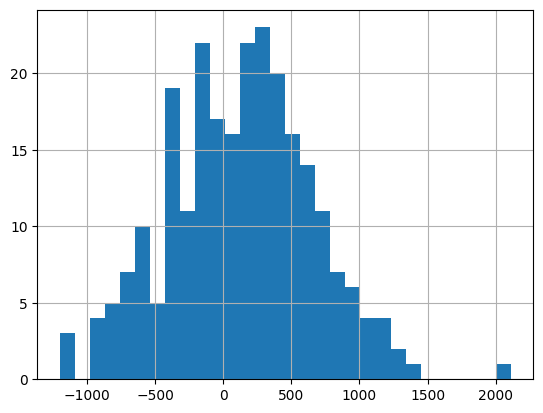

In [2]:
mu = 100
sigma = 500
  
# using the gauss() method 
df = pd.Series([rn.gauss(mu, sigma) for _ in range(250)])
df.hist(bins=30)

df.describe(), df.mode()


## Меры изменчивости


### Размах

R = max - min

### Дисперсия и стандартное отклонение

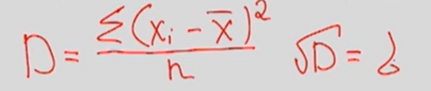

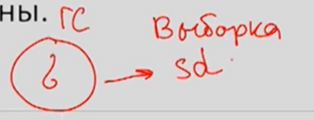

Для дисперсии в выборке из n вычитаем единицу

### Их свойства

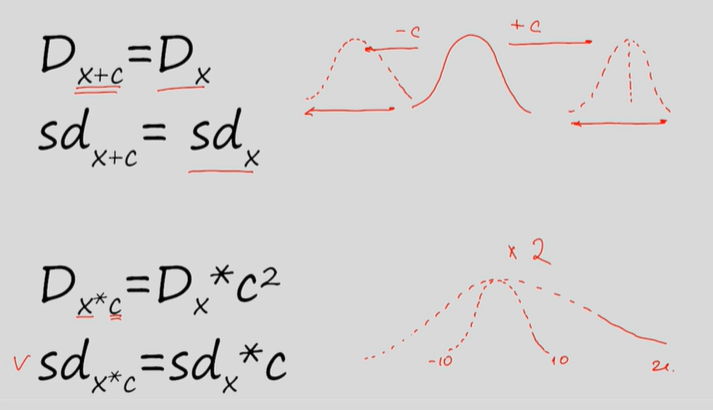


## Квартили и Box-plot

Межквартильный размах

медиана в центре ящика, границы - 1 и 3 квартили

усы - 1.5 межквартильного размаха

<Axes: >

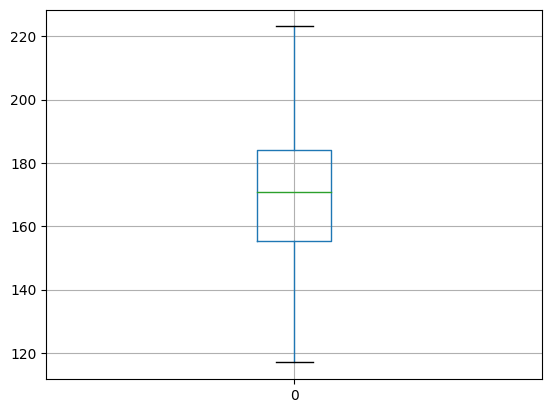

In [3]:
mu = 170
sigma = 20
  
# using the gauss() method 
df = pd.DataFrame([rn.gauss(mu, sigma) for _ in range(250)])
df.boxplot()

In [4]:
df[0]

0      130.282496
1      167.020911
2      142.590528
3      188.606418
4      200.316185
          ...    
245    176.685184
246    150.448388
247    218.907067
248    156.229208
249    163.493318
Name: 0, Length: 250, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x21ede85f5b0>,
 'caps': [<matplotlib.lines.Line2D at 0x21ede85faf0>,
 'boxes': [<matplotlib.lines.Line2D at 0x21ede85f310>],
 'medians': [<matplotlib.lines.Line2D at 0x21ede660070>],
 'fliers': [<matplotlib.lines.Line2D at 0x21ede660310>],
 'means': []}

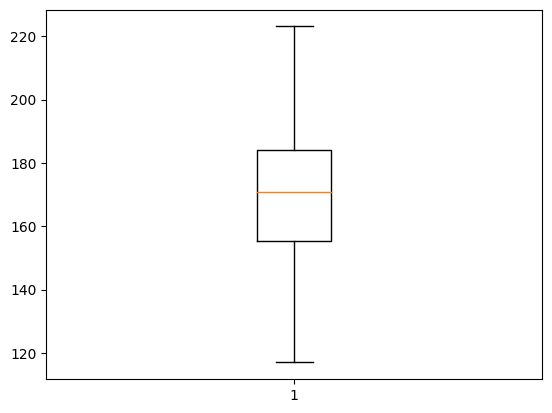

In [5]:
fig, axs = plt.subplots(1, 1)

# basic plot
axs.boxplot(df)
# axs.scatter(np.array(df.index), np.array(df[0]))

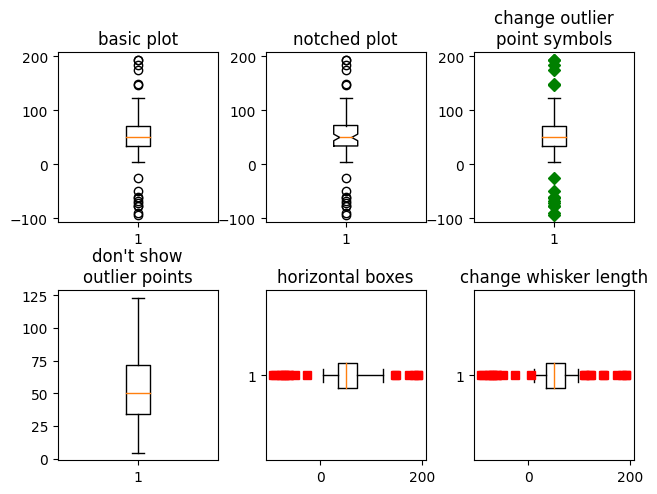

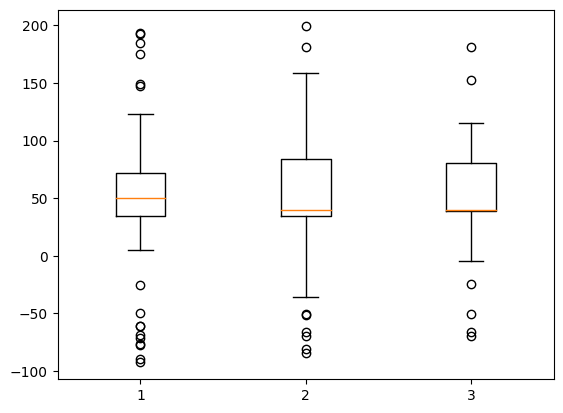

In [6]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib.patches import Polygon

# Fixing random state for reproducibility
np.random.seed(19680801)

# fake up some data
spread = np.random.rand(50) * 100
center = np.ones(25) * 50
flier_high = np.random.rand(10) * 100 + 100
flier_low = np.random.rand(10) * -100
data = np.concatenate((spread, center, flier_high, flier_low))

fig, axs = plt.subplots(2, 3)

# basic plot
axs[0, 0].boxplot(data)
axs[0, 0].set_title('basic plot')

# notched plot
axs[0, 1].boxplot(data, 1)
axs[0, 1].set_title('notched plot')

# change outlier point symbols
axs[0, 2].boxplot(data, 0, 'gD')
axs[0, 2].set_title('change outlier\npoint symbols')

# don't show outlier points
axs[1, 0].boxplot(data, 0, '')
axs[1, 0].set_title("don't show\noutlier points")

# horizontal boxes
axs[1, 1].boxplot(data, 0, 'rs', 0)
axs[1, 1].set_title('horizontal boxes')

# change whisker length
axs[1, 2].boxplot(data, 0, 'rs', 0, 0.75)
axs[1, 2].set_title('change whisker length')

fig.subplots_adjust(left=0.08, right=0.98, bottom=0.05, top=0.9,
                    hspace=0.4, wspace=0.3)

# fake up some more data
spread = np.random.rand(50) * 100
center = np.ones(25) * 40
flier_high = np.random.rand(10) * 100 + 100
flier_low = np.random.rand(10) * -100
d2 = np.concatenate((spread, center, flier_high, flier_low))
# Making a 2-D array only works if all the columns are the
# same length.  If they are not, then use a list instead.
# This is actually more efficient because boxplot converts
# a 2-D array into a list of vectors internally anyway.
data = [data, d2, d2[::2]]

# Multiple box plots on one Axes
fig, ax = plt.subplots()
ax.boxplot(data)

plt.show()

## Нормальное распределение

Унимодально, симметричное, подчиняется определенному закону распределения

### z-стандартизация

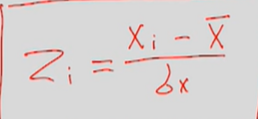

### Дотплот

In [7]:
def dotplot(input_x, **args):
 
    # Count how many times does each value occur
    unique_values, counts = np.unique(input_x, return_counts=True)
    
    # Convert 1D input into 2D array
    scatter_x = [] # x values 
    scatter_y = [] # corresponding y values
    for idx, value in enumerate(unique_values):
        for counter in range(1, counts[idx]+1):
            scatter_x.append(value)
            scatter_y.append(counter)
 
    # draw dot plot using scatter() 
    plt.scatter(scatter_x, scatter_y, **args)
    
    # Optional - show all unique values on x-axis. 
    # Matplotlib might hide some of them  
    plt.gca().set_xticks(unique_values)

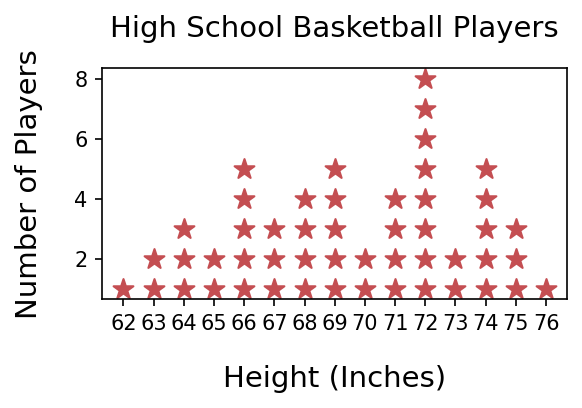

In [8]:
hs_heights = np.array([
    71, 67, 64, 72, 65, 69, 66, 68, 69, 72, 
    69, 73, 69, 72, 73, 74, 76, 68, 66, 63, 
    67, 71, 72, 74, 68, 69, 75, 71, 72, 72, 
    65, 66, 72, 74, 66, 62, 75, 75, 64, 63, 
    64, 66, 74, 67, 72, 70, 71, 70, 74, 68
])

# dpi - controls sharpness 
plt.figure(figsize=(4, 2), dpi=150)
 
dotplot(input_x=hs_heights, marker='*', color='#C44E52', s=100)
 
plt.xlabel("Height (Inches)", fontsize=14, labelpad=15)
plt.ylabel("Number of Players", fontsize=14, labelpad=15)
plt.title("High School Basketball Players", fontsize=14, pad=15)
plt.show()

Для того чтобы найти с какой вероятностью число превышает моду мы проводим стандартизацию

и... ищем по таблице)))

## Центральная предельная теорема

https://gallery.shinyapps.io/CLT_mean/

Se - стандартная ошибка среднего - показывает стандартное отклонение средних значений из выборок

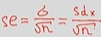

Сигма - изменчивоть исследуемого признака, n - число наблюдений

При n > 30 можно испольщвать второе равенство

Позволяет по выборке определить стандартное отклонение ГС

se = см формулу

Стандартная ошибка - это соотношение стандартного отклонения к квадратному корню кол-ва наблюдений. Кол-во наблюдений  в данном случае постоянно.

## Доверительные интервалы для среднего

X +- 1.96 SE

Доверительный интервал

## Идея статистического вывода, p-уровень значимости


Проверяет достоверность результатов

Пусть больные выздоравливают за 20 дней
дали им лекарства, и
Х = 18.5 дней
n = 64 людей
sd_x = 4

Приведем две гипотезы
1. Лекарство не работает - мы получили такие результаты совершенно случайно

2. Лекарство 
рПервоет

1. это значит, М = 40 - дней на выздоровление без лекарства
Посчитаем стандартное отклонение ГС
se = sd_x / n^0.5 = 0.5

Посчитаем в скольки стандартных отклонениях находится наш результат
(z-преобразование)
z = (X-M) / se = -3
Вероятность этого p = 0.003

Если вероятноть гипотезы p < 0.05, то вероятнее всего, что эта гипотеза не верна.

Если p > 0.05, то нулевою гипотезу нельзя отвергать (но ничего более).

	В данном случает при р = 0.003 не значит, что нулевая гипотеза верна с такой 
вероятностью. Это значит, что если верная нулевая гипоза, то получения такого результата (и
более сильных различий)p = 0.003


	Ошибки
1 - го рода - отклонение нулевой гипотезы, хотя она была верна
2 - го рода - принятие нулевой гипозеры, хотя она была ложна

	Порог p при котором не отклоняется нулевая гипотеза - alfa
При alfa = 0.05 нулевая гипотеза отклоняется при p < 0.05
Чем меньше α, тем меньше шансов отклонить достоверную нулевую гипотезу.

Идея статистического вывода - допускаем что верна нулеваягипотеза. После считаем вероятность получения существующихх или даже более сильных раличий - p-уровень значимости - 

# Сравнение средних

## Т-распределение

### Т-распределение (Стьюдента)

Как нормальное но хвосты более высокие / при малом количестве наблюдений

Чем больше степеней свободы тем более похоже на нормальное распределение

Речь про средние средних. Например при степени свободы 1 мы выбираем мног овыборок в которых  всего два наблюдения и и из их средних формируется распределение стьюдента

mean_gs = 10

mean_sd = 10.8 # найти вероятность получить такое или более выраженное отклонение

sd = 2

N = 25


In [9]:
from scipy.stats import t

df = 25 - 1 # число степеней свободы

t.cdf(10, df)

0.9999999997542237

True


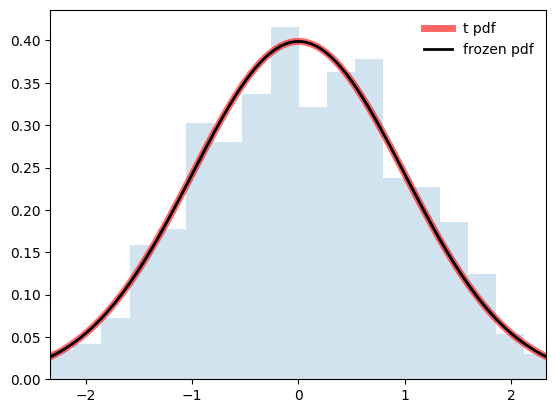

0.39884255731370694
0.9771148267533741


In [10]:
import numpy as np
from scipy.stats import t
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)

df = 1000 # степени свободы
mean, var, skew, kurt = t.stats(df, moments='mvsk')

x = np.linspace(t.ppf(0.01, df),
                t.ppf(0.99, df), 100)
ax.plot(x, t.pdf(x, df), # плотность распределения
       'r-', lw=5, alpha=0.6, label='t pdf') 

rv = t(df)
ax.plot(x, rv.pdf(x), 'k-', lw=2, label='frozen pdf')

vals = t.ppf([0.001, 0.5, 0.999], df)
print(np.allclose([0.001, 0.5, 0.999], t.cdf(vals, df)))

r = t.rvs(df, size=1000)

ax.hist(r, density=True, bins='auto', histtype='stepfilled', alpha=0.2)
ax.set_xlim([x[0], x[-1]])
ax.legend(loc='best', frameon=False)
plt.show()

print(t.pdf(0, df)) # вероятность получить данное значение
print(t.cdf(2, df)) # площадь

## Проверка распределений на нормальность, QQ-plot

Показывает насколько хорошо полученные значения соответствуют нормальному распределению

Нужен когда данных не особенно много

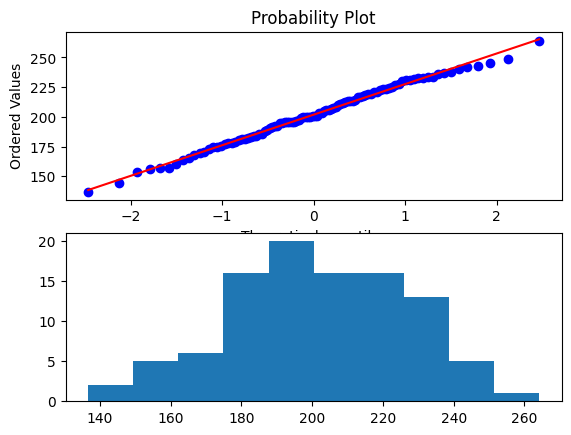

In [11]:
import numpy as np 
import pylab 
import matplotlib.pyplot as plt
import scipy.stats as stats

fig, axs = plt.subplots(2, 1)
m1 = np.random.normal(loc = 200, scale = 5 ** 2, size=100)   
axs[1].hist(m1)
stats.probplot(m1, dist="norm", plot=axs[0])

# n, p = 10, .5  # number of trials, probability of each trial
# m2 = np.random.binomial(n, p, 1000)  
# axs[1, 1].hist(m2, bins=30)
# stats.probplot(m2, dist="norm", plot=axs[1, 0])

print()

Тесты на нормальность - тест  Шапира Уилко и Колмагорова Смирнова

In [12]:
import numpy as np
from scipy import stats
rng = np.random.default_rng()
stats.kstest(stats.uniform.rvs(size=100, random_state=rng), #Критерий Колмагорова смирнова
             stats.norm.cdf)

# тут мы запихиваем равномерное распределение
# нулевая гипотеза - данные распределены неравномерно

KstestResult(statistic=0.5038237591227389, pvalue=5.045738354935038e-24, statistic_location=0.009584889491216386, statistic_sign=-1)

In [13]:
# x = stats.norm.rvs(size=100, random_state=rng)
print(stats.kstest(m1, stats.norm.cdf))
print()
print(stats.kstest(np.array([i for i in range(100)]), stats.norm.cdf))

KstestResult(statistic=1.0, pvalue=0.0, statistic_location=136.6959177887861, statistic_sign=-1)

KstestResult(statistic=0.9686501019683699, pvalue=8.407042721960085e-151, statistic_location=3, statistic_sign=-1)


In [14]:
from scipy import stats
res = stats.shapiro(m1)
res.statistic

x = np.array([148, 154, 158, 160, 161, 162, 166, 170, 182, 195, 236])

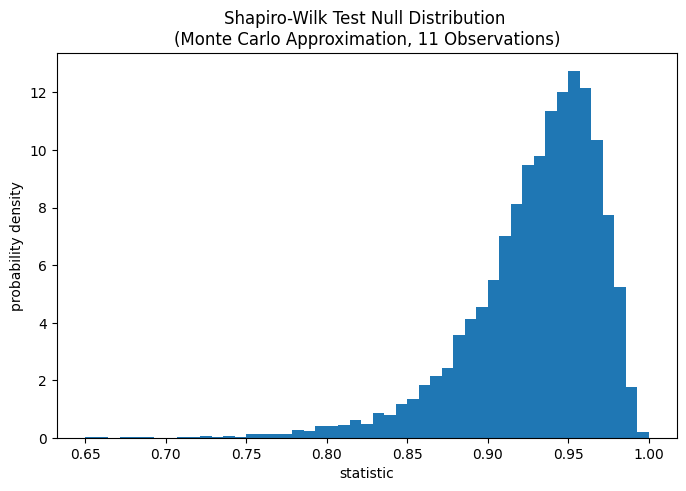

In [15]:
def statistic(x):
    # Get only the `shapiro` statistic; ignore its p-value
    return stats.shapiro(x).statistic
ref = stats.monte_carlo_test(x, stats.norm.rvs, statistic,
                             alternative='less')
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 5))
bins = np.linspace(0.65, 1, 50)
def plot(ax):  # we'll reuse this
    ax.hist(ref.null_distribution, density=True, bins=bins)
    ax.set_title("Shapiro-Wilk Test Null Distribution \n"
                 "(Monte Carlo Approximation, 11 Observations)")
    ax.set_xlabel("statistic")
    ax.set_ylabel("probability density")
plot(ax)

plt.show()

0.9155746102333069

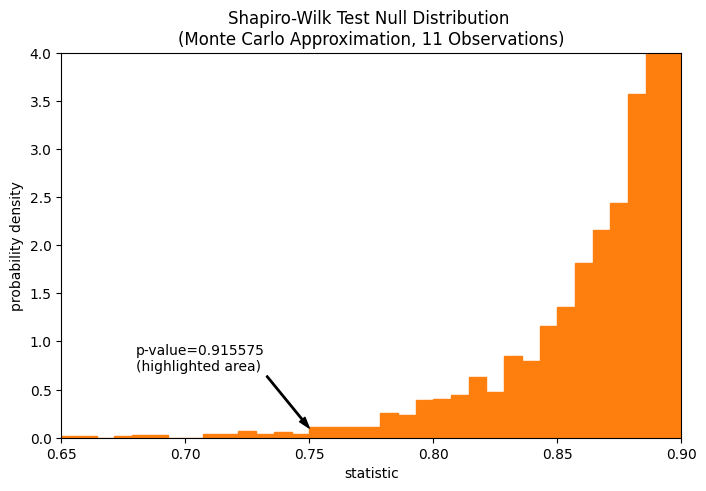

In [16]:
fig, ax = plt.subplots(figsize=(8, 5))
plot(ax)
annotation = (f'p-value={res.pvalue:.6f}\n(highlighted area)')
props = dict(facecolor='black', width=1, headwidth=5, headlength=8)
_ = ax.annotate(annotation, (0.75, 0.1), (0.68, 0.7), arrowprops=props)
i_extreme = np.where(bins <= res.statistic)[0]
for i in i_extreme:
    ax.patches[i].set_color('C1')
plt.xlim(0.65, 0.9)
plt.ylim(0, 4)
plt.show
res.pvalue

## Что делать если распределение сильно отличается от номрального

Применяем критерий Манна-Уитни

Мы используем U-критерий Манна-Уитни, чтобы оценить, существует ли статистически значимая разница в возрасте постановки диагноза у мужчин и женщин. Нулевая гипотеза заключается в том, что распределение возраста постановки диагноза мужчинам совпадает с распределением возраста постановки диагноза женщинам. 

In [17]:
males = [19, 22, 16, 29, 24]
females = [20, 11, 17, 12]
from scipy.stats import mannwhitneyu
U1, p = mannwhitneyu(males, females, method="exact")
print(U1)
nx, ny = len(males), len(females)
U2 = nx*ny - U1
print(U2)
print(p)

17.0
3.0
0.1111111111111111


## ANOVA Однофакторный дисперсионный анализ

Очень часто в экспериментах и исследованиях возникает необходимость сравнить несколько групп между собой. В таком случае мы можем применять однофакторный дисперсионный анализ.  Та переменная, которая будет разделять наших испытуемых или наблюдения на группы (номинативная переменная с нескольким градациями) называется независимой переменной. А та количественная переменная, по степени выраженности которой мы сравниваем группы, называется зависимая переменная. 

In [18]:
import pandas as pd

Н0 - все наблюдения - одна ГС
Н1 - хотя бы пара средних значительно различается между собой

In [19]:
dataframe = pd.read_csv(r'C:\Users\user\Desktop\genetherapy.csv')
dataframe.describe(), dataframe.shape, dataframe.columns,dataframe.head(5)

(             expr
 count   60.000000
 mean    96.316667
 std      5.619252
 min     84.000000
 25%     93.000000
 50%     96.000000
 75%    100.000000
 max    107.000000,
 (60, 2),
 Index(['expr', 'Therapy'], dtype='object'),
    expr Therapy
 0   100       A
 1    96       A
 2   101       A
 3    95       A
 4   103       A)

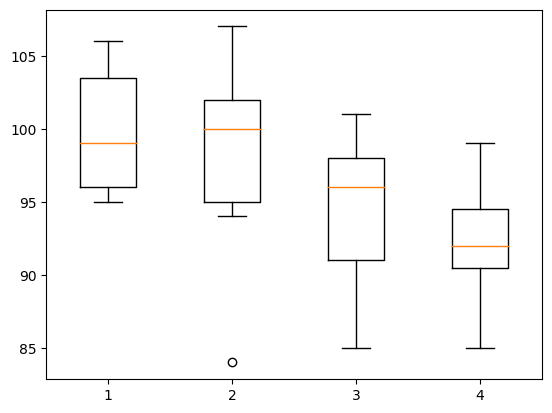

In [20]:
data = [pd.Series(pd.DataFrame(i[1])['expr']) for i in dataframe.groupby('Therapy')]
plt.boxplot(data)
print()

1 Считаем среднее (считая что это все одна группа)

SST - общая сумма квадратов - насколько высока изменчивость данных без разделения на группы

Сравненивает несколько групп между собой. 
Независимая переменная - разделяет испытуемых на группы/должна быть нормальной
Зависимая переменая - по которой группы сравниваются
есть 3 группы
1 2 3
value
3 5 7
1 3 6
2 4 5
Н0 М1=М2=М3
Н1 хотя бы 1 в другой группе

Среднее значение всех элементов (считам все значения из всех групп)
XX = 3+1+22+5+3+4+7+6+5/9 = 4
SST(общая сумма квадратов) - насколько высока изменчивость данных без учета разделения их на 
группы
SST = E(i-XX)**2 = 30
i - значения
f (правильно df) = N-1 = 8
SST = SSB(Сумма квадратов междугрупповая) + SSW(Сумма квадратов внутригрупповая)
SSW=E(E(i-X)**2)) - теперь с учетом разбиения по группам
SSW = 6
df=N-m = 9-3=6
SSB=E j*(X-XX)**2 = 24
j -  число элементов совокупности
df=m-1=3-1=2
Если большую часть общей изменчивости обеспечивается SSB то группы значительно различаются,
иначе группы не отличаются и вся изменчивость внутри групп

F = SSB/(m-1) * (N-m) / SSW - ф значение
F = 12

Допустим верна Н0 то Х различаются мало и основные изменчивости - внутривыборочные, тогда
SSB/(m-1)--->0
(N-m) / SSW ===const
Распределение фишера

В нашем случае p=0.008

	Когда мы делим значение межгрупповой суммы квадратов на соответствующее число 
степеней свободы (число групп минус один), мы тем самым усредняем полученный показатель. 
Усредненное значение межгрупповой суммы квадратов называется межгрупповым средним квадратом

MS_bg = SSB/df_bg
df_bg=m-1  

	Отношение внутригрупповой суммы квадратов к соответствующему числу степеней свободы
 (число всех наблюдений минус число групп) — это внутригрупповой средний квадрат


MS_wg = SSW/df_wg
df_wg=m-1  

Тогда F=MS_bg/MS_wg

In [21]:
from scipy import stats

In [22]:
stats.f_oneway(*data)

F_onewayResult(statistic=8.03730248114399, pvalue=0.0001524972289522953)

Чем больше внутригрупповая изменчивость тем меньше ф значение. См. РАспределение фишера

In [23]:
import numpy as np
from scipy.stats import f
import matplotlib.pyplot as plt


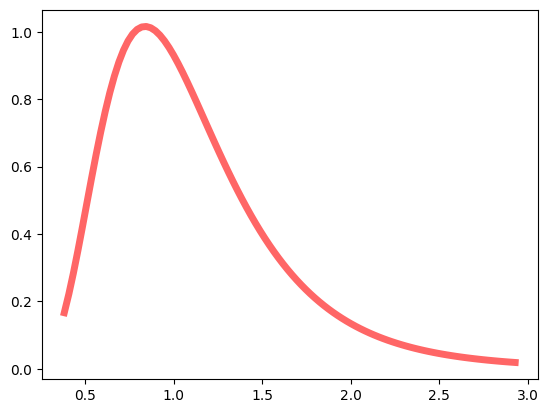

In [24]:
fig, ax = plt.subplots(1, 1)
dfn, dfd = 29, 18
mean, var, skew, kurt = f.stats(dfn, dfd, moments='mvsk')
x = np.linspace(f.ppf(0.01, dfn, dfd), # границы графика
                f.ppf(0.99, dfn, dfd), 100) # какое значение мы получим при указанной закраске графика
ax.plot(x, f.pdf(x, dfn, dfd), # функция распределения вероятность
       'r-', lw=5, alpha=0.6, label='f pdf')

In [25]:
vals = f.ppf([0.001, 0.5, 0.999], dfn, dfd)
vals

array([0.27535707, 1.01440182, 4.32127784])

In [26]:
f.cdf(vals, dfn, dfd) # возвращает закрашенную зону левее данного значения

array([0.001, 0.5  , 0.999])

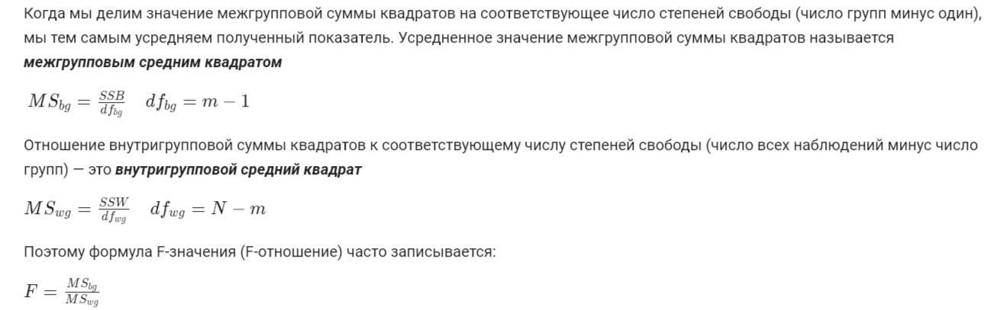

## Множественное сравнение в ANOVA

In [27]:
import random

In [28]:
m = 0
s = 1

p_list = []

n = 2
print(np.random.normal(m, s, n),  np.random.normal(m, s, n))
print(stats.f_oneway(np.random.normal(m, s, n),  np.random.normal(m, s, n)))

[-0.10917284  0.20721772] [-0.63726368 -1.79009952]
F_onewayResult(statistic=14.104332391764594, pvalue=0.06415288845775469)


,p_val
flag,
False,37
True,963


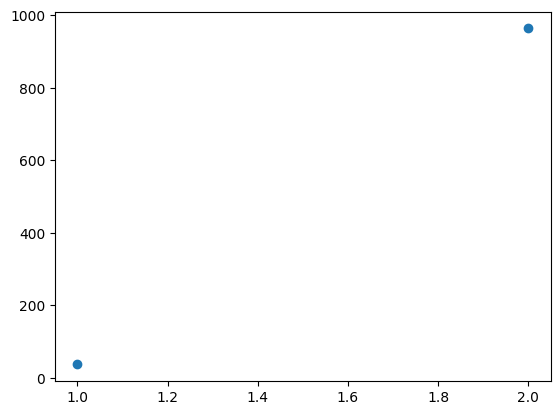

In [29]:
i = 1000
n = 2
p_val = 0.05
df = pd.DataFrame([stats.f_oneway(np.random.normal(m, s, n),  np.random.normal(m, s, n)) for _ in range(i)], columns=['stat', 'p_val'])
df.drop('stat',axis=1, inplace=True)
df['flag'] = df['p_val'] > p_val
plt.scatter([1, 2], df.groupby('flag').count())
df.groupby('flag').count()

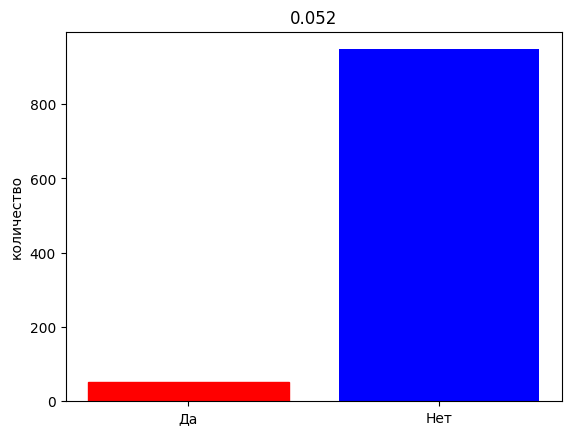

In [30]:
import scipy.stats as stats
from matplotlib import pyplot
import itertools
import numpy as np

M = 0
D = 1

def ttest(a , b):
    se = np.sqrt( a['SD']**2/a['N'] + b['SD']**2/b['N']  )
    t = (a['Mx'] - b['Mx'])/se
    dfreedom = a['N'] + b['N'] - 2
    return stats.t.sf(np.abs(t), dfreedom)*2

# n - элементов в выборке
# m - количество выборок
# a -  вероятность
def false_alarm(m, n, a):
    trys = 1000 # количество экспериментов
    hist = {'Да':0, 'Нет':0} # результаты сравнений     
    data = list(range(m)) # инициализация групп с выборками
    
    # запускаем trys экспериментов
    for i in range(trys):
        
        # наполняем m выборок, для ускорения сразу их агрегируем по SD, Mx, N
        for j in range(m):
            dt = stats.norm.rvs(loc=M, scale=D, size=n)
            data[j] = {'SD':np.std(dt, ddof = 1), 'Mx':np.mean(dt), 'N':n}
        
        #сравниваем выборки по 2 группы, перебор можно реализовать с помощью двух циклов или воспользоваться itertools
        for first, second in itertools.combinations(data, 2):
            if ttest(first, second) <= a:
                hist['Да']+=1
                break
        else:
            hist['Нет']+=1

    # рисуем гитограмму частот
    barlist = pyplot.bar(hist.keys(), hist.values(), color='b')
    barlist[0].set_color('r')
    pyplot.title(round(hist['Да'] / trys,3))
    pyplot.ylabel('количество')
    pyplot.show()

false_alarm(2,30,0.05)

### Поправки

Бонферрони

Тьюки

In [31]:
res = stats.tukey_hsd(*data)
print(res)
print(type(res))

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)      0.933     0.951    -3.729     5.596
 (0 - 2)      5.333     0.019     0.671     9.996
 (0 - 3)      7.400     0.001     2.737    12.063
 (1 - 0)     -0.933     0.951    -5.596     3.729
 (1 - 2)      4.400     0.071    -0.263     9.063
 (1 - 3)      6.467     0.003     1.804    11.129
 (2 - 0)     -5.333     0.019    -9.996    -0.671
 (2 - 1)     -4.400     0.071    -9.063     0.263
 (2 - 3)      2.067     0.646    -2.596     6.729
 (3 - 0)     -7.400     0.001   -12.063    -2.737
 (3 - 1)     -6.467     0.003   -11.129    -1.804
 (3 - 2)     -2.067     0.646    -6.729     2.596

<class 'scipy.stats._hypotests.TukeyHSDResult'>


[0.6204107442268376, 0.004351321150980016, 1.984712107437826e-05, 0.038709471845164996, 0.0012495059794330318, 0.22121372700724676]
                 AB                  AC                  AD                  BC                  BD                  CD


<BarContainer object of 6 artists>

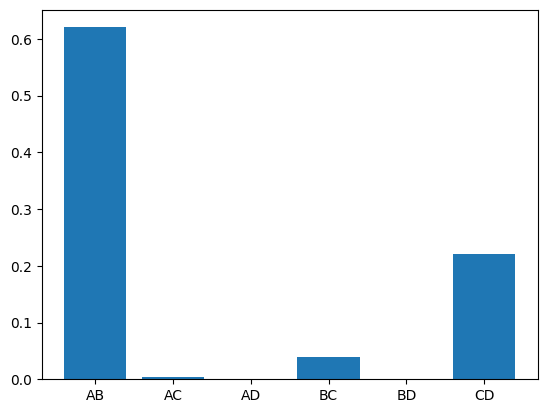

In [32]:
dfb = []
s='ABCD'
s_l = []
for i in range(4):
    for j in range(i + 1, 4):
        dfb.append(stats.ttest_ind(data[i], data[j])[-1])
        s_l.append(s[i] + s[j])
print(dfb)
print(*[i.rjust(19) for i in s_l])
plt.bar(s_l, dfb)

## ANOVA многофакторный

In [33]:
import os

In [34]:
os.chdir(r'C:\Users\user\Desktop')

In [35]:
data_birds = pd.read_csv('birds.csv')
data_sclero = pd.read_csv('atherosclerosis.csv')

In [36]:
data_birds

,var4,hormone,sex
0,17.859039,1,1
1,20.842343,1,1
2,19.318099,1,1
3,20.064451,1,1
4,17.620316,1,1
...,...,...,...
59,17.054195,0,0
60,22.951551,0,0
61,18.799382,0,0
62,16.543161,0,0


In [37]:
data_sclero

,expr,age,dose
0,107.351478,1,D1
1,104.504438,1,D1
2,103.435134,1,D1
3,109.572882,1,D1
4,114.993803,1,D1
...,...,...,...
59,101.851582,2,D2
60,105.239530,2,D2
61,99.350198,2,D2
62,108.091455,2,D2


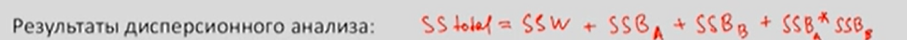

               sum_sq  df         F    PR(>F)
age        197.452754   1  7.449841  0.008313
dose        16.912241   1  0.638094  0.427552
age:dose     0.927077   1  0.034978  0.852272
Residual  1590.257424  60       NaN       NaN


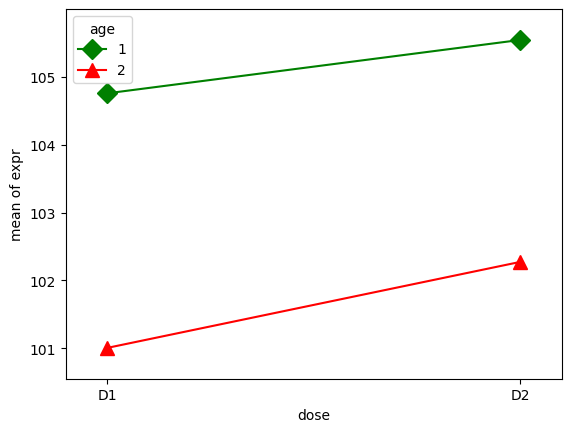

In [38]:
import pandas as pd
from statsmodels.graphics.factorplots import interaction_plot
from scipy import stats

data=data_sclero
#Картинка
fig=interaction_plot(data.dose,data.age,data.expr,colors=['green','red'], markers=['D','^'], ms=10)
#Степени свободы
N =  len(data.expr)
m1 = len(data.age.unique())
m2 = len(data.dose.unique())
df_a = m1 - 1
df_b = m2 - 1
df_axb = df_a*df_b 
df_w = N - m1*m2
#Общее среднее
grand_mean = data['expr'].mean()
#Суммы квадратов
ssq_a = sum([(data[data.age ==i].expr.mean()-grand_mean)**2 for i in data.age])
ssq_b = sum([(data[data.dose ==i].expr.mean()-grand_mean)**2 for i in data.dose])
ssq_t = sum((data.expr - grand_mean)**2)
spl_age=[data[data.age == i] for i in data.age.unique()]
age_means=[[x_age[x_age.dose == d].expr.mean() for d in x_age.dose] for x_age in spl_age]
ssq_w = sum([sum((spl_age[i].expr-age_means[i])**2) for i in range(len(data.age.unique()))])
ssq_axb = ssq_t-ssq_a-ssq_b-ssq_w
#Средние квадраты
ms_a = ssq_a/df_a
ms_b = ssq_b/df_b
ms_axb = ssq_axb/df_axb
ms_w = ssq_w/df_w
#F-значения
f_a = ms_a/ms_w
f_b = ms_b/ms_w
f_axb = ms_axb/ms_w
#P-значения
p_a = stats.f.sf(f_a, df_a, df_w)
p_b = stats.f.sf(f_b, df_b, df_w)
p_axb = stats.f.sf(f_axb, df_axb, df_w)
#результаты
results = {'sum_sq':[ssq_a, ssq_b, ssq_axb, ssq_w],
           'df':[df_a, df_b, df_axb, df_w],
           'F':[f_a, f_b, f_axb, 'NaN'],
            'PR(>F)':[p_a, p_b, p_axb, 'NaN']}
columns=['sum_sq', 'df', 'F', 'PR(>F)']
aov_table1 = pd.DataFrame(results, columns=columns,
                          index=['age', 'dose', 
                          'age:dose', 'Residual'])
print(aov_table1)

<Axes: xlabel='dose', ylabel='expr'>

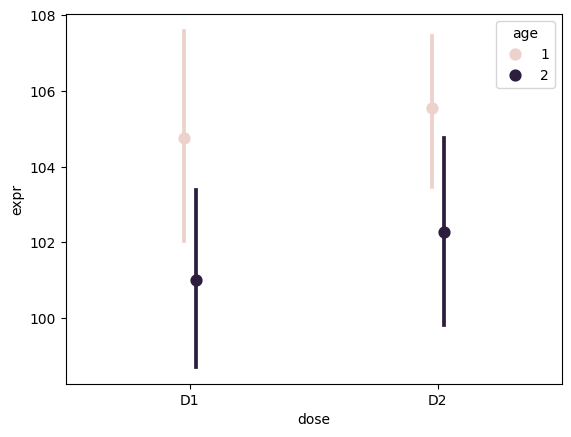

In [39]:
import seaborn as sns

import pandas as pd

df = pd.read_csv('atherosclerosis.csv')

sns.pointplot(x=df.dose, y=df.expr, hue=df.age, data=df, dodge=True, linestyles=['', ''])

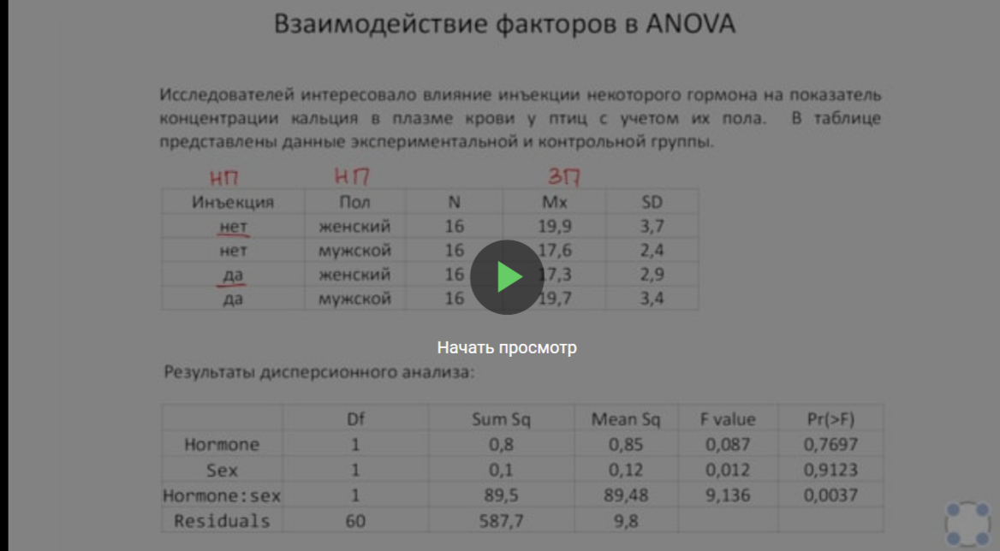

In [40]:
import pandas as pd
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

data = data_birds

formula = 'var4 ~ C(hormone) + C(sex) + C(hormone):C(sex)'
model = ols(formula, data).fit()
aov_table = anova_lm(model, typ=2)
print(aov_table)

                       sum_sq    df         F    PR(>F)
C(hormone)           0.847472   1.0  0.086528  0.769653
C(sex)               0.119762   1.0  0.012228  0.912318
C(hormone):C(sex)   89.483384   1.0  9.136390  0.003682
Residual           587.650394  60.0       NaN       NaN


Как видно большую долю сыграло взаимодействие факторов (2.6)
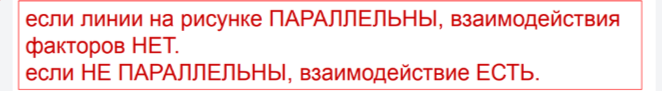

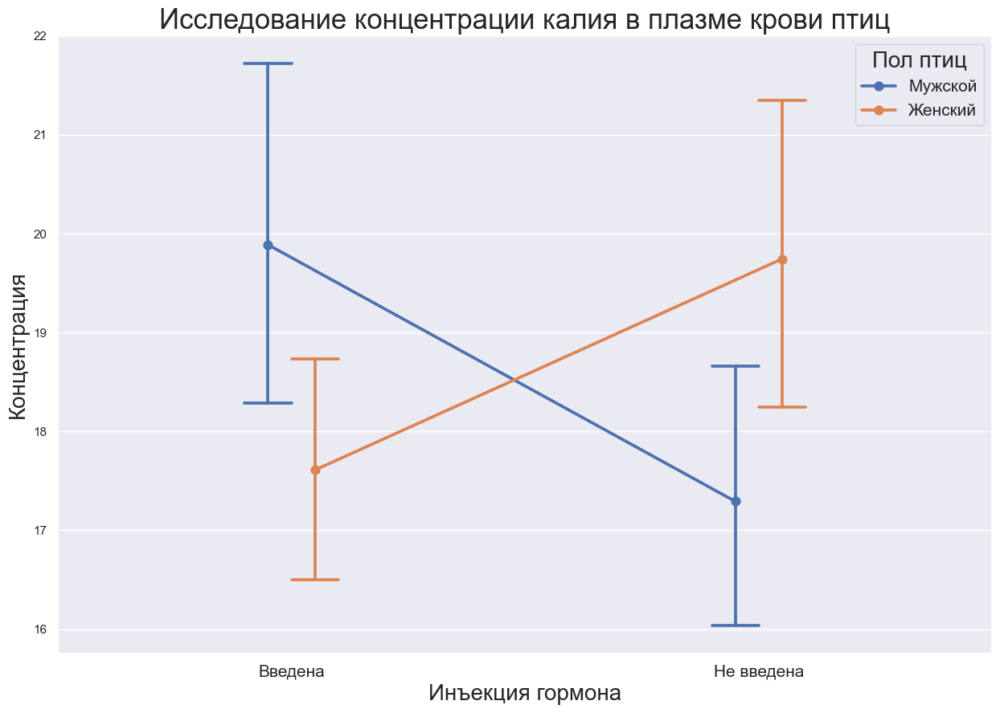

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# считываем файл

data1 = pd.read_csv('https://stepik.org/media/attachments/lesson/9250/birds.csv')


# задаем размеры выводимого графика

sns.set(rc={'figure.figsize':(15, 10)})


# строим график с помощью seaborn

pplot = sns.pointplot(x='hormone', y='var4', hue='sex', dodge=0.1, capsize=.1, data=data1)


# меняем названия титула, оси х и оси у

plt.title('Исследование концентрации калия в плазме крови птиц', fontsize=25)
plt.xlabel('Инъекция гормона', fontsize=20)
plt.ylabel('Концентрация', fontsize=20)


# меняем названия отложенных по оси х значений

bars = ('Введена', 'Не введена')
x_pos = np.arange(len(bars))
plt.xticks(x_pos, bars, fontsize=15)


# меняем "Легенду" та, что в верхнем правом углу

leg_handles = pplot.get_legend_handles_labels()[0]
pplot.legend(leg_handles, ['Мужской', 'Женский'], title='Пол птиц', title_fontsize=20, fontsize=15)

# если хотите сохранить график себе

plt.savefig('cool.jpg')
plt.savefig('not_cool.pdf')

### QQ-plot

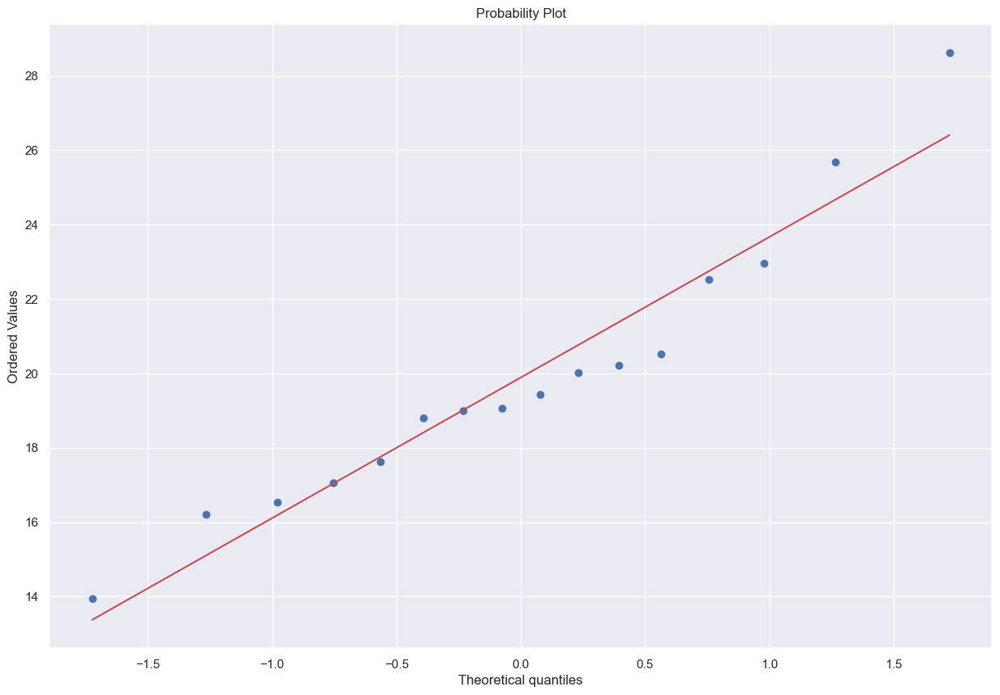

ShapiroResult(statistic=0.94510418176651, pvalue=0.4162890613079071)


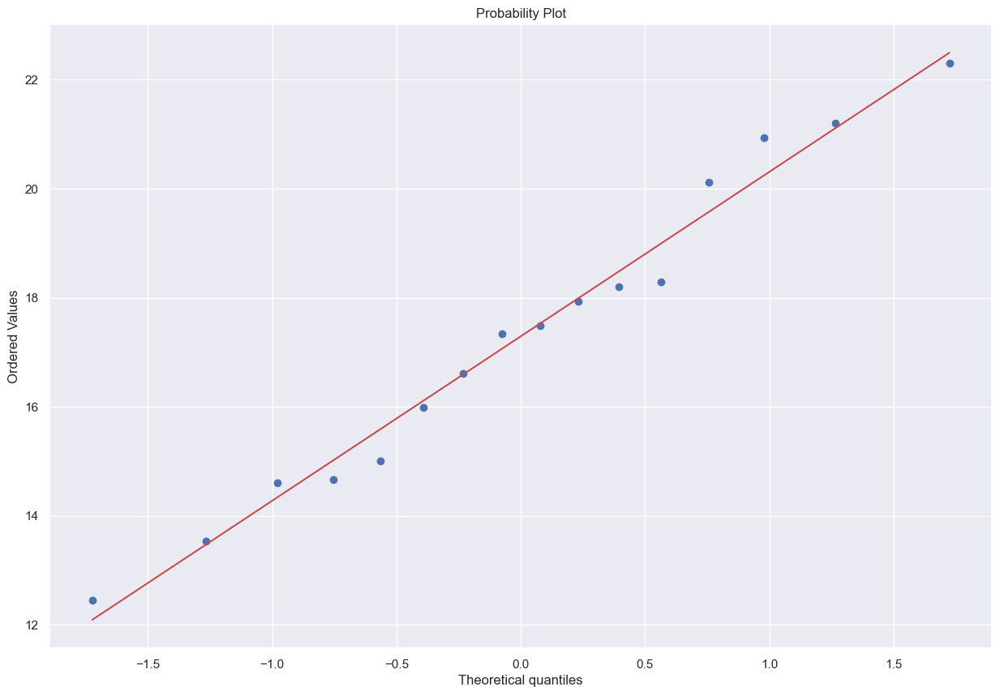

ShapiroResult(statistic=0.9721516370773315, pvalue=0.8721426129341125)


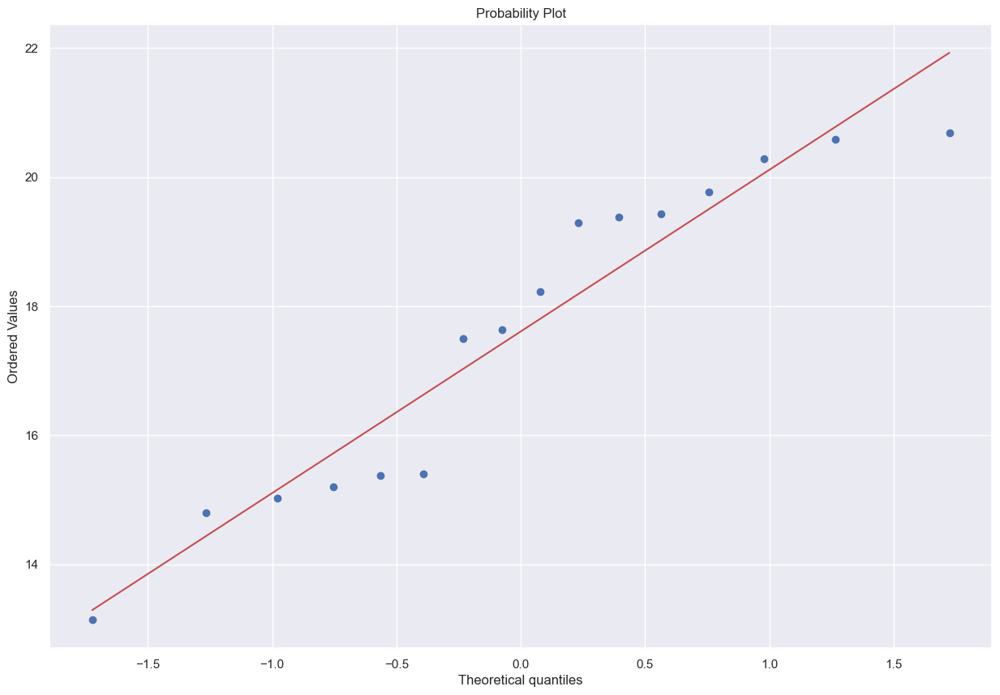

ShapiroResult(statistic=0.9067473411560059, pvalue=0.10314302891492844)


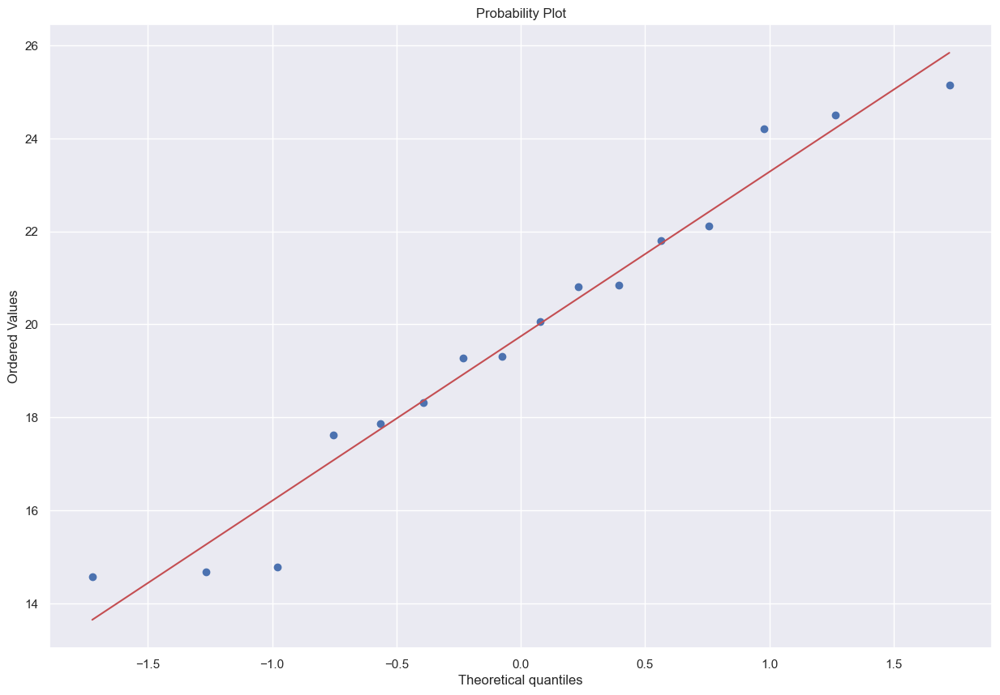

ShapiroResult(statistic=0.94819176197052, pvalue=0.4615950882434845)


In [42]:
import scipy.stats as sm
from scipy.stats import shapiro, probplot
import pylab
dataset = data1
x1 = dataset[(dataset["sex"] == 0) & (dataset["hormone"] == 0)]["var4"].values
x2 = dataset[(dataset["sex"] == 0) & (dataset["hormone"] == 1)]["var4"].values
x3 = dataset[(dataset["sex"] == 1) & (dataset["hormone"] == 0)]["var4"].values
x4 = dataset[(dataset["sex"] == 1) & (dataset["hormone"] == 1)]["var4"].values
for i in [x1, x2, x3, x4]:
    probplot(i, dist="norm", plot=pylab)
    pylab.show()
    print(shapiro(i))

## А/В тесты

АБ тестирование - это проведение экспериментов при помощи статистики, пожалуй, самый яркий пример того, зачем статистика нужна в реальной жизни!) A/B тесты - один из основных инструментов в продуктовой аналитике. Этот метод маркетингового исследования заключается в том, что контрольная группа элементов сравнивается с набором тестовых групп, где один или несколько показателей изменены для того, чтобы выяснить, какие из изменений улучшают целевой показатель. Например, мы можем поменять цвет кнопки для регистрации с красного на синий и сравнить, насколько это будет эффективно.

https://stepik.org/lesson/411390/step/2?unit=400826

# Корреляция

Взаимосвязь двух зависимых переменных

Диаграмма рассеивания или scatterplot

$\frac{\sum(x_i-X)(y_i-Y)}{(N-1)} = cov$ - ковариация - сила и взаимовязь двух переменных

$r_{xy}$ = $\frac{cov}{\delta_x \delta_y}$

или

$r_{xy} = \frac{\sum(x_i-X)(y_i-Y)}{\sum(x_i-X)^2\sum(y_i-Y)^2}$

Кэффициент детирменации - квадрат ковариации - степень зависимость изменчивости одной переменно влиянием другой

In [43]:
data

,var4,hormone,sex
0,17.859039,1,1
1,20.842343,1,1
2,19.318099,1,1
3,20.064451,1,1
4,17.620316,1,1
...,...,...,...
59,17.054195,0,0
60,22.951551,0,0
61,18.799382,0,0
62,16.543161,0,0


Н0 - коэфф корреляции в ГС равен 0

Н1 - коэф корреляции 0 не равен

t считаем при 

df = N - 2 - число степеней свобод

data: x and y
t = 2.06697, df = 48, p-value = 0.04415
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
[0.00819306 0.52264617]
sample estimates:
cor
0.2858888


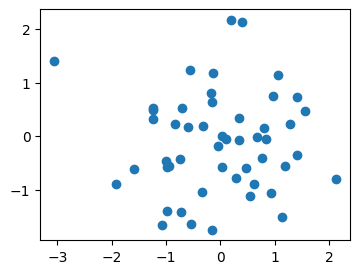

In [2]:
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np

def cortest(corr, lenX):
    #t value
    t = corr[0] * ((len(X) - 2) / (1 - corr[0]**2))**0.5
    print("data: x and y")
    print("t = {}, df = {}, p-value = {}".format(round(t,5), len(X)-2, round(stats.t.sf(np.abs(t), 48)*2,5)))

    # Use the Fisher transformation to get z
    z = np.arctanh(corr[0])
    #print("z value: {}".format(z))

    # And, the sigma value i.e standard error
    sigma = (1/((len(X)-3)**0.5))
    #print("sigma value: {}".format(sigma))

    # Get normal 95% interval probability density function for normal continuous random variable apply two-sided conditional formula
    cint = z + np.array([-1, 1]) * sigma * stats.norm.ppf((1+0.95)/2)
    
    #Finally take hyperbolic tangent to get interval values for 95%
    interval = np.tanh(cint)
    
    if corr != 0:
        print("alternative hypothesis: true correlation is not equal to 0")
    print("95 percent confidence interval:")
    print(interval)
    print("sample estimates:")
    print("cor")
    print(corr[0])

# так вычисляем корреляцию
X = stats.norm.rvs(loc=0, scale=1, size=50)
Y = stats.norm.rvs(loc=0, scale=1, size=50)
corr = stats.pearsonr(X, Y)

# так строим scatter plot

fig, ax = plt.subplots(1, 1, figsize=(4, 3))
ax.scatter(X,Y)
# plt.grid()
# plt.show()

#print("correlation: {}".format(corr))

#т.к. из лекции мы не знаем выборки, то сразу подставляем корреляцию из лекции
cortest((0.2858888,), 50)

## Условия применения корреляции

Линейная взаимосвязь

нормальное распределение обеих переменных

Для нелинейной зависимости - коэф корреляции спирмана и коэф корреляции таокендала - переходят к ранжированным значениям

SignificanceResult(statistic=0.24168163157672948, pvalue=0.4491887440384277)


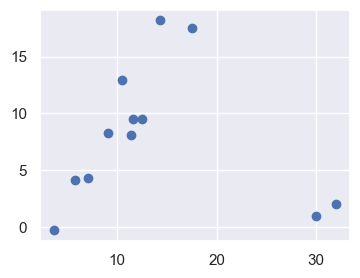

In [45]:
import numpy as np

import scipy.stats as st

import matplotlib.pyplot as plt

 

X = np.array([3.7, 5.8, 7.1, 9.1, 10.5, 11.4, 11.6, 12.5, 14.3, 17.5, 30.0, 32.0])

Y = np.array([-0.3, 4.1, 4.3, 8.3, 12.9, 8.1, 9.5, 9.5, 18.2, 17.5, 1.0, 2.0])

fig, ax = plt.subplots(1, 1, figsize=(4, 3))
print(stats.spearmanr(X, Y))
ax.scatter(X, Y)


## Регрессионный анаизл
	 
Регрессионный анализ - совокупность методов исследования зависимости нескольких переменных
между собой

по у - называется зависимой переменной
по х - независимая или предиктор

	Регрессия о том, как одна переменная определяет, позволяет предсказать другую переменную
	Для того чтобы провести прямую максимально совпадающую с облаком точек, нужно
у = в_0 + в_1 * х
в_0 - интерсепт(свободный член)
в_1 - слоуп

	Метод (1 из) построения регрессионной кривой - метод наименьших квадратов МНК (не
пишу ибо и так все понятно). Тут остаток - разница между координатами

	Как найти в_0 и в_1
в_1 = sd_y / sd_x * r_xy
r_xy - корреляция
sd -стандартное отклонение
в_0 = Y - b_1 * X 
	Например
^y = 0.84 * x + 5.4
^ - хеад, показывает что предсказывает точки которые ляжут на регрессионную прямую
орреляция
sd -стандартное отклонение
в_0 = Y - b_1 * X 
	Например
^y = 0.84 * x + 5.4
^ - хеад, показывает что предсказывает точки которые ляжут на регрессионную прямую


## Логистическая регрессия

Всё также анализ номинативных переменных


	 
Регрессионный анализ - совокупность методов исследования зависимости нескольких переменных
между собой

по у - называется зависимой переменной
по х - независимая или предитор

	Регрессия о том, как одна переменная определяет, позволяет предсказать другую перменную
	Для того чтобы провести прямую максимально совпадающую с облаком точ
 е$к, нужно
у = в_0$
 $+ в$_1 * х
в_0 - интерсепт(своб
о$дны$й член)
в1 - слоуп

	Метод (1 из) построения регрессионной кривой - метод наименьших квадратов МНК (не
пишу ибо и так все понятно). Тут остаток - разница междукоординатами

	Ка
 к$ найти в_0 и в_1
в_1 {= }$
s$d_{y }$/ sd_x * r_xy

r_xy - корреляция
sd -ст
а$ндартное отклонен$
е
в_0 = Y
  - b_1 * X 
	Наприм
ер
^y = 0.84 * x + 5.4
^ - хеад, показывает что предсказывает точки которые ляжут на регрессионную прямую


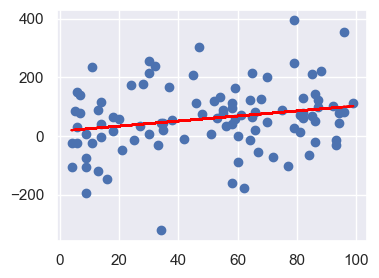

In [46]:
import matplotlib.pyplot as plt
import numpy as np


x = np.random.randint(1, 100, 100)
y = x + np.random.randint(-20, 20, 100) * np.random.normal(0, 10, 100)
# x = x.reshape(-1, 1)
# y = y.reshape(-1, 1)


fig, ax = plt.subplots(1, 1, figsize=(4, 3))
ax.scatter(x, y)
b1, b0 = np.polyfit(x, y, 1) #  b0 - intercept, b1 - slope
ax.plot(x, b0 + b1*x, color='red')


In [47]:
import sklearn
import pandas as pd
import numpy as np
import pickle
import joblib

import matplotlib.pyplot as plt
import sklearn.model_selection as model_selection

from sklearn import svm
from sklearn import datasets

from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, recall_score, mean_absolute_error, mean_squared_error, r2_score

import sklearn.model_selection as model_selection
from sklearn.linear_model import LinearRegression
from sklearn import metrics

import numpy as np
from sklearn import metrics 

random_state = 42
n = 100

x = np.random.randint(1, 100, n)
y = x + np.random.randint(-20, 10, n) * np.random.normal(0, 1, n)
x = x.reshape(-1, 1)
y = y.reshape(-1, 1)

Mean Absolute Error: 7.612011612317389
Mean Squared Error: 109.78986418685977
Root Mean Squared Error: 10.47806586097166
0.88077052652011


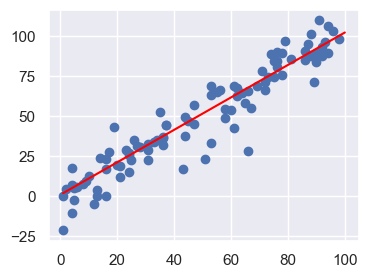

In [48]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(x, y, random_state=random_state)


reg = LinearRegression()
reg.fit(X_train, y_train)

ox = np.linspace(1, 100, n * 5).reshape(-1, 1)
oy = reg.predict(ox)

y_pred = reg.predict(X_train)
y_test = y_train


print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(metrics.r2_score(y_test, y_pred))


fig, ax = plt.subplots(1, 1, figsize=(4, 3))

ax.scatter(x, y)
ax.plot(ox, oy, color = 'red')


## Гипотеза о значимости взаимосвязи и коэффициент детерминации

Если взаимосвязи нет - $b_1 = 0, b_2 = \sigma_y$

Н0 - в ГС переменные никак не связаны то $b_1=0$

Н1 - в ГС $b_1!=0$

t-критерий - если многократно повторить эксперимент то при Н0 выборочные значения коэф b_1 распределилисьбы нормально вокруг 0

т.е. проверяем t-критерием отличность b_1 от нуля

## Коэффициент детерминации 

Часть дисперсии одной переменной обуслаевоемой взаимосвязью с другой переменной

см r2_score

## Условия применения линейной регрессии с одним предиктором

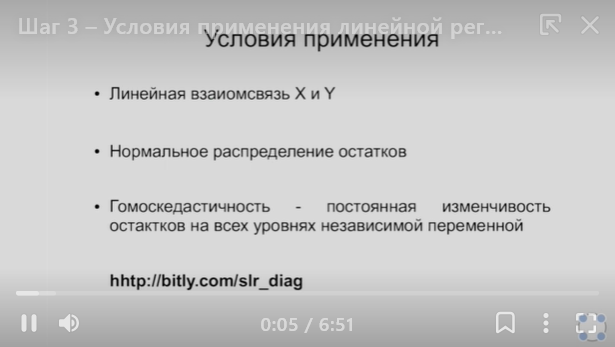
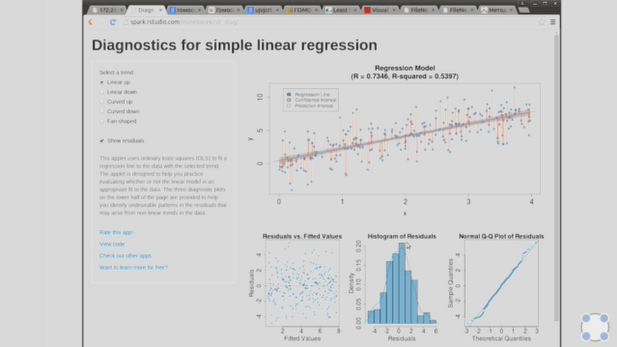
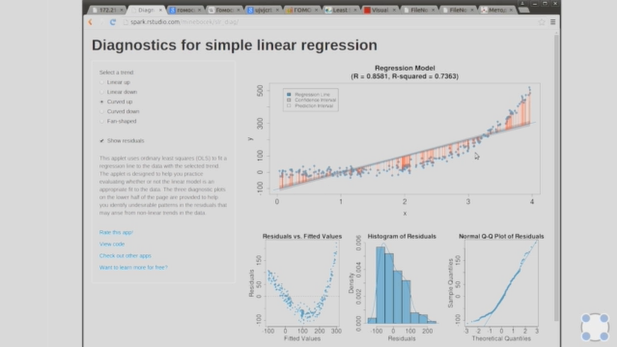
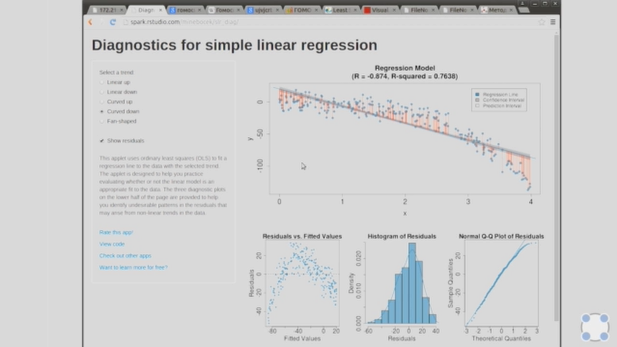
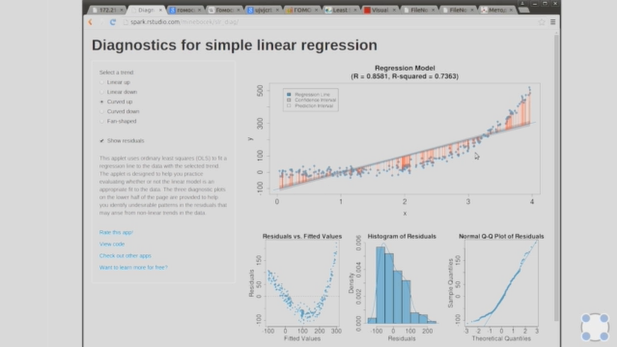
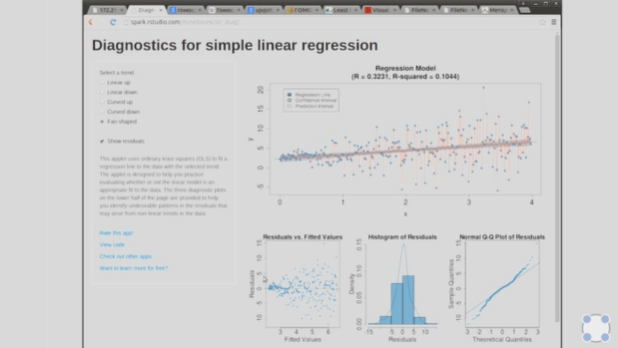

## Применение регрессионного анализа и интерпретация результатов

In [49]:
os.getcwd()

'C:\\Users\\user\\Desktop'

In [50]:
df = pd.read_csv('states.csv')
df.describe()

,metro_res,white,hs_grad,poverty,female_house
count,51.000000,51.000000,51.000000,51.000000,51.000000
mean,72.249020,81.719608,86.011765,11.349020,11.633333
std,15.275894,13.897223,3.725998,3.099185,2.356155
min,38.200000,25.900000,77.200000,5.600000,7.800000
25%,60.800000,76.800000,83.300000,9.250000,9.550000
50%,71.600000,85.400000,86.900000,10.600000,11.800000
75%,86.800000,90.250000,88.700000,13.400000,12.650000
max,100.000000,97.100000,92.100000,18.000000,18.900000


In [51]:
df.head(5)
#процент проживающих в столичной области
#белык
#процент со среднем образованием
# сколько бедных
# сколько домохозяек

,state,metro_res,white,hs_grad,poverty,female_house
0,Alabama,55.4,71.3,79.9,14.6,14.2
1,Alaska,65.6,70.8,90.6,8.3,10.8
2,Arizona,88.2,87.7,83.8,13.3,11.1
3,Arkansas,52.5,81.0,80.9,18.0,12.1
4,California,94.4,77.5,81.1,12.8,12.6


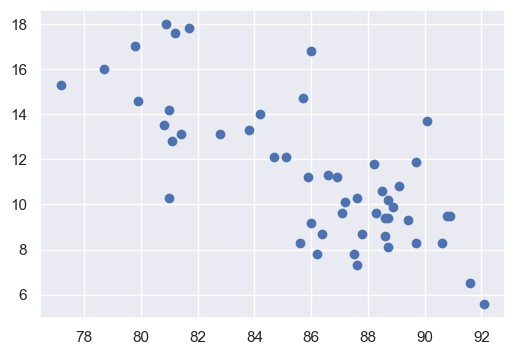

In [52]:
fig, axs = plt.subplots(1, 1, figsize=(6, 4))

axs.scatter(df['hs_grad'], df['poverty'])

Н0 - отличается ли b_1 от нуля

In [53]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(df['hs_grad'], df['poverty'], test_size=0.25, random_state=random_state)
X_train, X_test, y_train, y_test = np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test)

reg = LinearRegression()
reg.fit(X_train.reshape(-1, 1), y_train.reshape(-1, 1))

ox = np.linspace(df['hs_grad'].min(), df['hs_grad'].max(), n * 5).reshape(-1, 1)
oy = reg.predict(ox).reshape(-1, 1)

y_pred = reg.predict(X_test.reshape(-1, 1))



print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(metrics.r2_score(y_test, y_pred))

Mean Absolute Error: 2.2476429850361646
Mean Squared Error: 8.357162410514356
Root Mean Squared Error: 2.890875716891744
0.31098990780893854


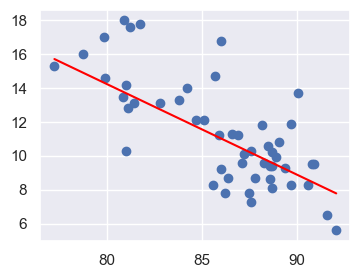

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(4, 3))

ax.scatter(df['hs_grad'], df['poverty'])
ax.plot(ox, oy, color = 'red')

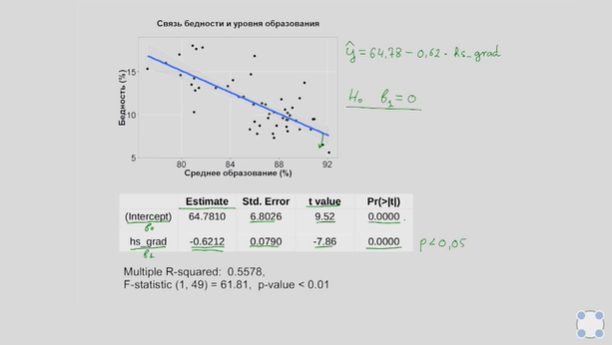

LinregressResult(slope=-0.6212167177940106, intercept=64.78096577010209, rvalue=-0.7468582531582505, pvalue=3.10882981031841e-10, stderr=0.0790164710017928, intercept_stderr=6.802595178281202)

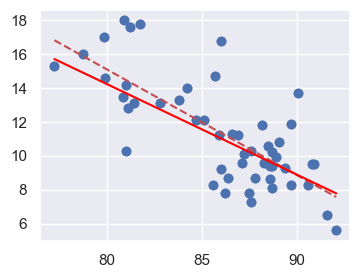

In [55]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
URL='http://d396qusza40orc.cloudfront.net/statistics/lec_resources/states.csv'
df=pd.read_csv(URL)
x=df["hs_grad"]
y=df["poverty"]
gradient, intercept, r_value, p_value, std_err = stats.linregress(x,y)
mn=np.min(x)
mx=np.max(x)
x1=np.linspace(mn,mx,500)
y1=gradient*x1+intercept


fig, ax = plt.subplots(1, 1, figsize=(4, 3))

ax.plot(x,y,'ob') #Рассталяем точки
ax.plot(x1,y1,'--r') #Рисуем линию
ax.scatter(df['hs_grad'], df['poverty'])
ax.plot(ox, oy, color = 'red')

stats.linregress (x, y)



In [56]:
stats.linregress(x, y)

LinregressResult(slope=-0.6212167177940106, intercept=64.78096577010209, rvalue=-0.7468582531582505, pvalue=3.10882981031841e-10, stderr=0.0790164710017928, intercept_stderr=6.802595178281202)

In [57]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(metrics.r2_score(y_test, y_pred))

Mean Absolute Error: 2.2476429850361646
Mean Squared Error: 8.357162410514356
Root Mean Squared Error: 2.890875716891744
0.31098990780893854


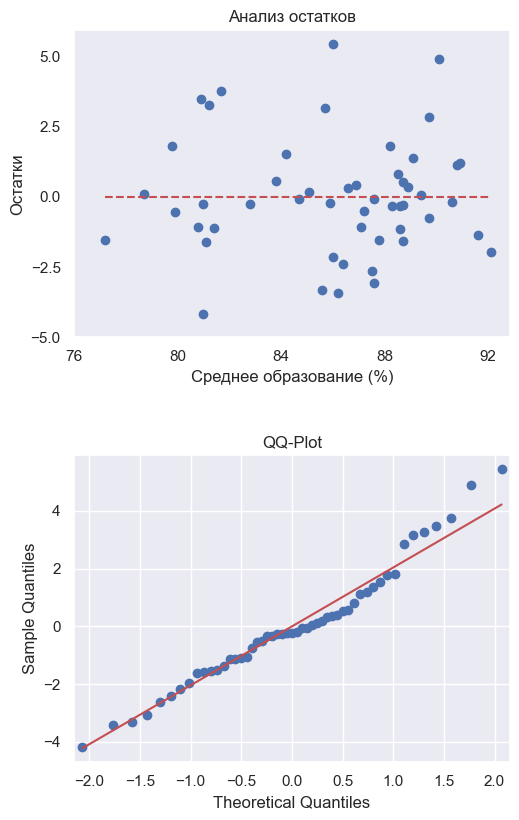

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.formula.api as sm
import statsmodels.api as sma

# получаем данные и вычисляем коэффициэнты регрессионной модели
data=pd.read_csv('states.csv', sep=',')
intercept, slope = sm.ols(formula="poverty ~ hs_grad", data=data).fit().params
X = data['hs_grad']
Y = data['poverty']

# вычисляем остатки - на сколько Y далека от теоретической модели
residuals = Y - intercept - slope*X
x1=np.linspace(min(X),max(X),len(X))

# создаем графики
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(6, 9))
# scatter plot
ax1.scatter(X,residuals)
ax1.plot(x1,[0]*len(x1),'--r')
# Q-Q plot
sma.qqplot(residuals, line='s', ax = ax2)

ax1.grid()
ax1.set_title('Анализ остатков')
ax1.set_xlabel('Среднее образование (%)')
ax1.set_ylabel('Остатки')
ax1.set_xticks(np.arange(76,93, step=4))
ax1.set_yticks(np.arange(-5,6, step=2.5))

ax2.set_title('QQ-Plot')

fig.tight_layout(pad=3.0)
plt.show()

## Регрессионный анализ с несколькими независимыми переменными

In [59]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [60]:
df.head(1)

,state,metro_res,white,hs_grad,poverty,female_house
0,Alabama,55.4,71.3,79.9,14.6,14.2


In [61]:
dataset = df.drop('state', axis=1)

In [62]:
dataset.corr()

,metro_res,white,hs_grad,poverty,female_house
metro_res,1.000000,-0.342442,0.018110,-0.204235,0.300062
white,-0.342442,1.000000,0.238156,-0.308520,-0.751394
hs_grad,0.018110,0.238156,1.000000,-0.746858,-0.611867
poverty,-0.204235,-0.308520,-0.746858,1.000000,0.525397
female_house,0.300062,-0.751394,-0.611867,0.525397,1.000000


fig, axes = plt.subplots(ncols=2, figsize=(10,4))
TestModels.R2_Y1.plot(ax=axes[0], kind='bar', title='R2_Y1')
TestModels.R2_Y2.plot(ax=axes[1], kind='bar', color='green', title='R2_Y2')
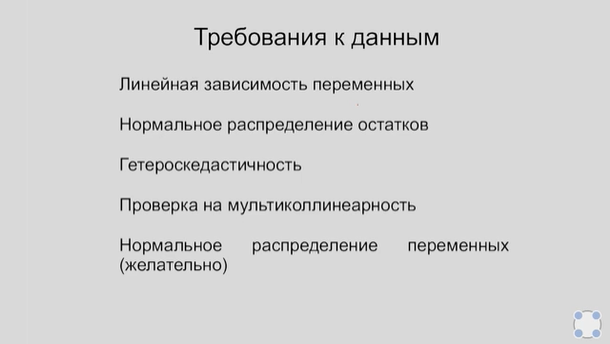

In [63]:
%matplotlib inline

In [64]:
import statsmodels.formula.api as smf
import pandas as pd
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np

%matplotlib notebook

data = pd.read_csv('http://d396qusza40orc.cloudfront.net/statistics/lec_resources/states.csv')

data.head()
data = data.drop('state', axis=1)

lm = smf.ols(formula='poverty ~ metro_res + hs_grad', data=data).fit()

lm.params

def f(x, y):
    return lm.params.Intercept + lm.params.hs_grad * x  + lm.params.metro_res * y

x = data.hs_grad.sort_values()
y = data.metro_res.sort_values()

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

fig = plt.figure(figsize = (4, 3))
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, alpha=0.3)
data_below_serf = data[data['poverty'] < f(data['hs_grad'], data['metro_res'])]
data_above_serf = data[data['poverty'] >= f(data['hs_grad'], data['metro_res'])]
ax.scatter(data_below_serf.hs_grad, data_below_serf.metro_res, data_below_serf.poverty, c='r', marker='o')
ax.scatter(data_above_serf.hs_grad, data_above_serf.metro_res, data_above_serf.poverty, c='g', marker='o')
ax.set_xlabel('hs_grad')
ax.set_ylabel('metro_res')
ax.set_zlabel('poverty')

<IPython.core.display.Javascript object>

Text(0.5, 0, 'poverty')

<IPython.core.display.Javascript object>

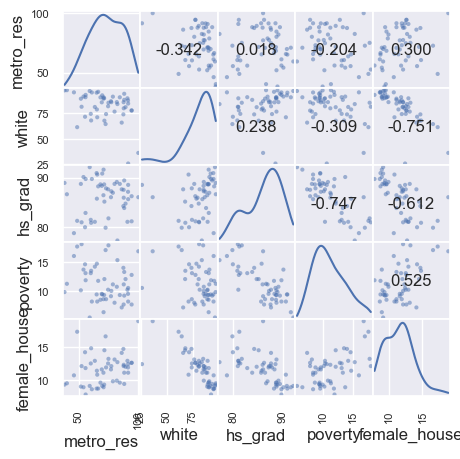

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

data = pd.read_csv(
    'http://d396qusza40orc.cloudfront.net/statistics/lec_resources/states.csv')
data = data.drop('state', axis=1)
%matplotlib inline
axes = pd.plotting.scatter_matrix(data, figsize=(5,5), diagonal='kde', grid=True)
corr = data.corr().values
for i, j in zip(*plt.np.triu_indices_from(axes, k=1)):
    axes[i, j].annotate("%.3f" %corr[i,j], (0.5, 0.5), xycoords='axes fraction', ha='center', va='center')
plt.show()


# Анализ номинативных данных

Предиктор - номинативная переменная

Для сравнения  кол-х и номинативных данных используют ttest или дисперсионный анализ

Н0 - все три партии встречаются с одной частотой

![image.png](attachment:2c9e455f-2520-4762-81e3-ea880221d882.png)

Но на гистограмме видны отклонения

Разберемся насколько значимы эти различия

Второ пример - взаимосвязь двух переменных

![image.png](attachment:d63bcb72-3f3d-4b55-948e-9739a17104e2.png)

Какое лекарство лучше

Насколько значимы эти различия

Какие предикторы влияют на номинативную переменную

Выздоровил не выздоровил

![image.png](attachment:f9573fc5-cbfa-4c9b-a3cd-2ce5dd4bb31f.png)

Поможет регрессионная модель - логистическая регрессия

## Расстояние Пирсона

Как проверить гипотезу различия между наблюдаемым событием и теоритеческим распределением

Расстояние хи квадраст, рапределение статистики хи квадрат, критерий хи квадрат пирсона

Для проверси гипотезы рассчитаем p-уровень значимоти

Как сильно отклонилось распределение от теоретического. Какие бы отклонения получали (см ПЦТ), и ккое отконение получили

Проверяем что монетка работает честно

In [66]:
def generate_rn_num(kol=10, border=(0, 1)):
    return [rn.randint(border[0], border[1]) for _ in range(kol)]

In [67]:
result = generate_rn_num(kol=1000, border=(0, 6))
df = pd.Series(result)

<Axes: >

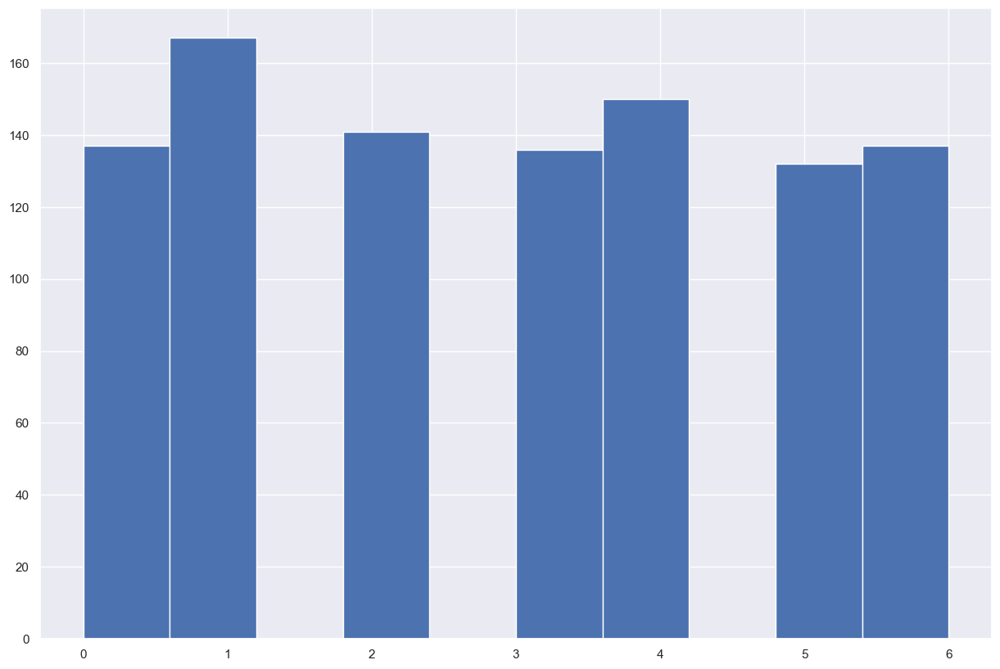

In [68]:
df.hist()

что было выше - игрушка

In [69]:
N = 60

sr = pd.Series({'orel': 40,
                   'rehka': 20})
sr

orel     40
rehka    20
dtype: int64

H0 P орла = 0.5
Н1 Р орла != 0.5

Градацие наблюдаемых частот номинативного признака - О

Ожидаемые значение - E

Рассчитаем ожидаемые значения частоты встречаемости орла и решки

In [70]:
O = np.array([20, 40])
E = np.array([30, 30])

In [71]:
# O = np.array([18, 55, 27])
# E = np.array([25, 50, 25])

Первое что приходит наум для оценки расхождения результата с теорией

In [72]:
((O - E) ** 2).sum() # некорректно - для примера возьми 1020 и 1040 - , нужно нормировать -

200

In [73]:
X_squart_pirsona = ((O - E) ** 2 / E ).sum() # показатель насколько сильно ожидаемые и наблюдаемые згначения отклоняются 

X**2 = E (Oi-Ei) ** 2 / E

А если бы многократно повторяли эксперимент, как бы тогда вел себя себя Х**2 при Н0

Распределение Х**2

In [74]:
X_squart_pirsona

6.666666666666667

In [75]:
col = 100000
my_lst = np.empty(col)
for i in range(col):
    O = np.random.randint(0,1000, 2)
    E = O.mean()
    my_lst[i] = ((O - E) ** 2 / E ).sum()
# pd.Series(my_lst).hist(bins=100)

C:\Users\user\AppData\Local\Temp\ipykernel_4464\4242336218.py:6: RuntimeWarning: invalid value encountered in divide
  my_lst[i] = ((O - E) ** 2 / E ).sum()


c = 1.39


my_density = gaussian_kde(my_lst, bw_method=0.1)


x = np.linspace(min(my_lst), max(my_lst), 1000)

plt.plot(x, my_density(x))
plt.hist(df['SalePrice'], bins=60, density=True) # накладывать эти штуки не совсем корректно
#кривулька - ядерная оценка плотность распрееления 
plt.title('Распределение хи квадрат')

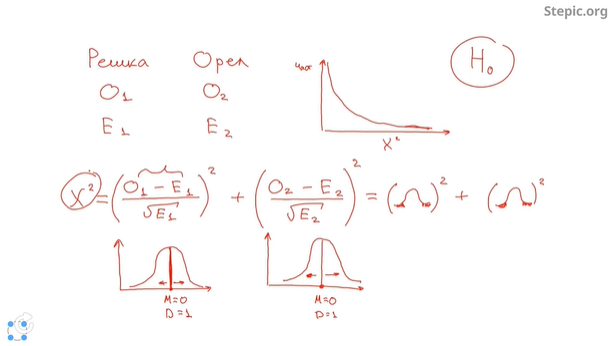

Из рисунков - распределение хи квадрат с к степенями свободы - распределение суммы квадратов к независимых стандартных нормальных случайных величин

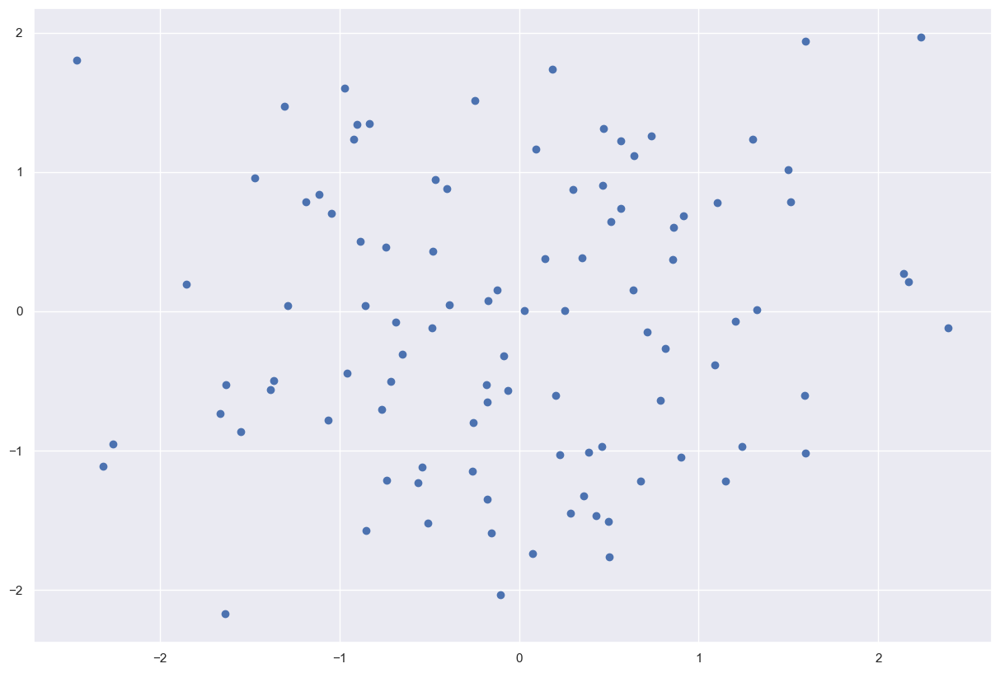

In [76]:
col = 100
x = np.random.normal(loc=0, scale=1, size=col)
y = np.random.normal(loc=0, scale=1, size=col)

plt.scatter(x, y)

Тут геометрическая интерпритацияхи квадрат. Аля это гипотенуза - расстояние от точки 0 0 до определенной точки

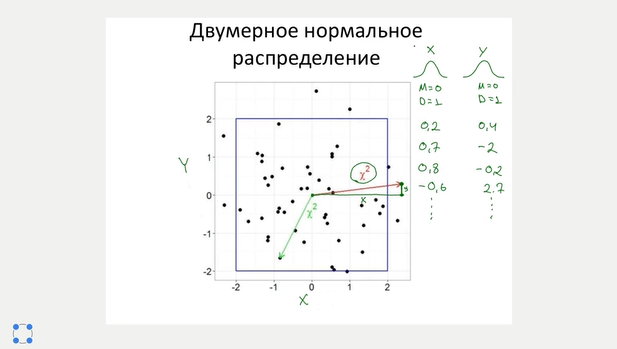

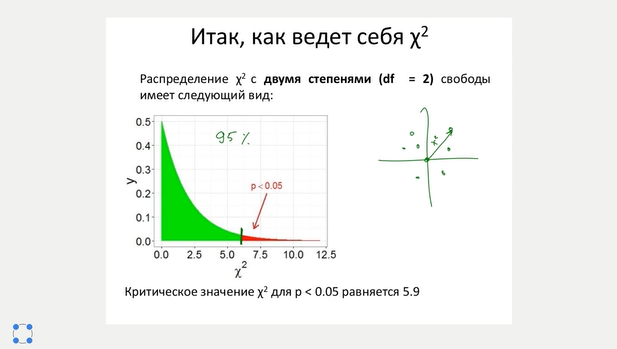

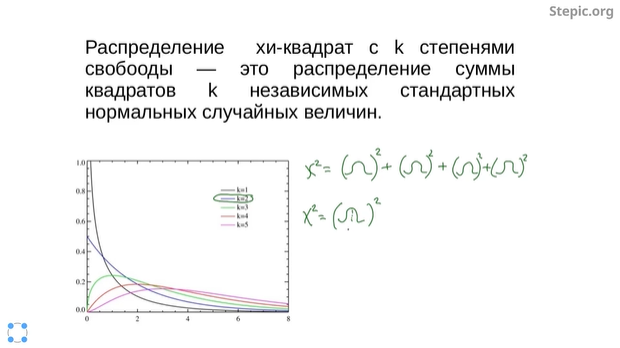

## Расчёт p-уровня значимости


In [77]:
O = np.array([20, 40])
E = np.array([30, 30])
X_squart_pirsona = ((O - E) ** 2 / E ).sum() # показатель насколько сильно ожидаемые и наблюдаемые згначения отклоняются 

### Про метод chi2

https://gallery.shinyapps.io/dist_calc/

In [78]:
from scipy.stats import chi2
chi2.ppf(0.5, 5)

4.351460191095528

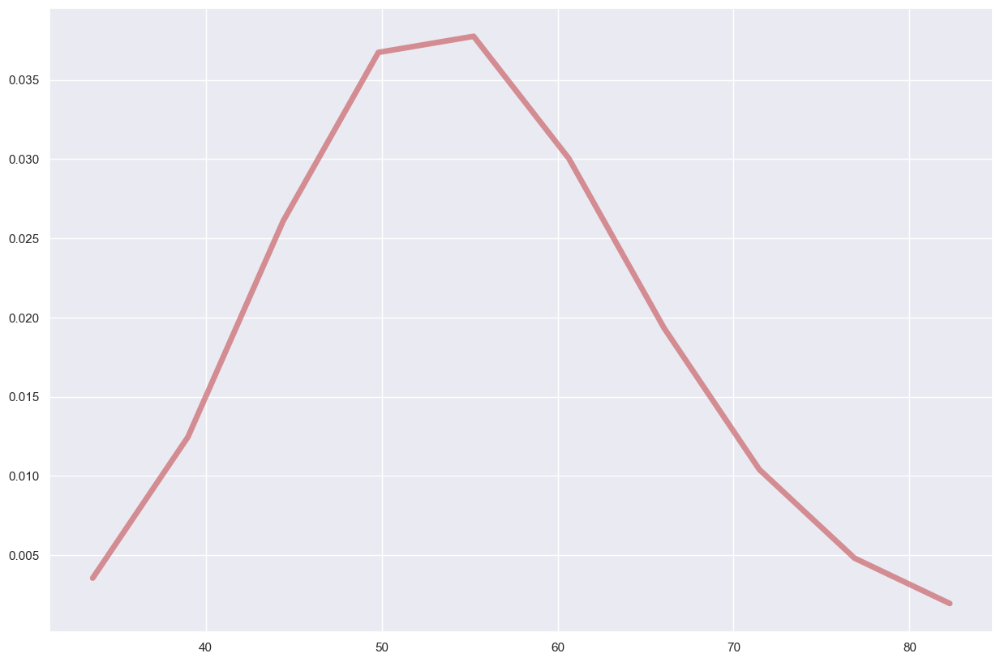

In [79]:
import numpy as np
from scipy.stats import chi2
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)

df = 55
mean, var, skew, kurt = chi2.stats(df, moments='mvsk')

x = np.linspace(chi2.ppf(0.01, df),
                chi2.ppf(0.99, df), 10)

#Percent point function (inverse of cdf — percentiles). 
# аля одна показывет p урвовент по отклонению cdf
# а другая какое должно быть отклонение при заданном уровне p значимости ppf
#PDF - функция распределения вероятности
ax.plot(x, chi2.pdf(x, df),
       'r-', lw=5, alpha=0.6, label='chi2 pdf')

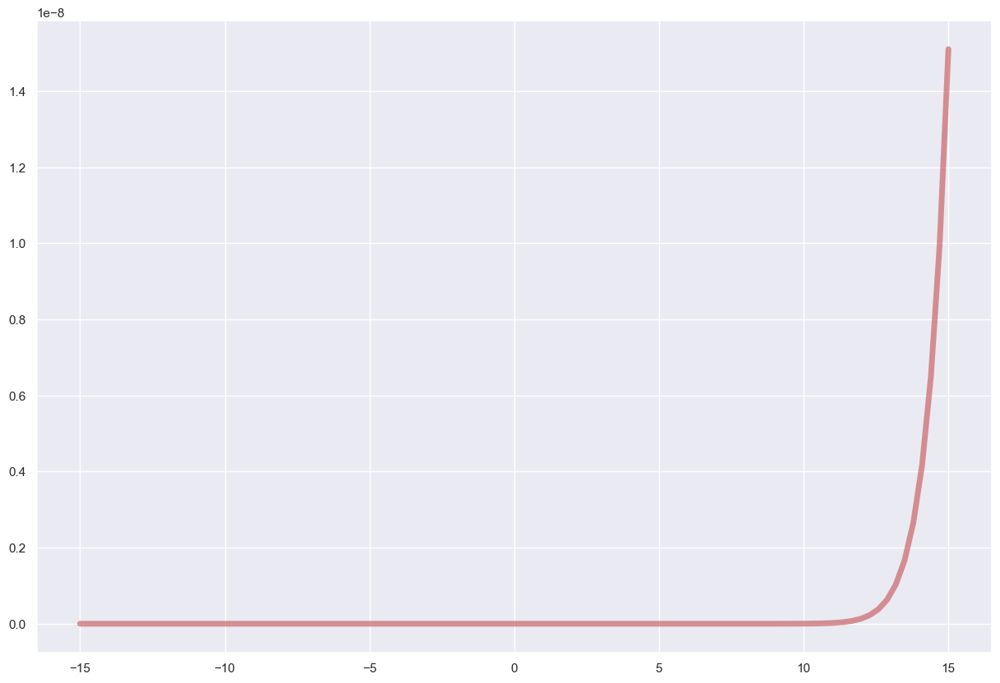

In [80]:
import numpy as np
from scipy.stats import chi2
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)

df = 55
mean, var, skew, kurt = chi2.stats(df, moments='mvsk')

x = np.linspace(-15,
                15, 100)

#Percent point function (inverse of cdf — percentiles).
ax.plot(x, chi2.cdf(x, df),
       'r-', lw=5, alpha=0.6, label='chi2 pdf')

### Задачи

In [81]:
# Какая доля наблюдений лежит в диапазоне от 2 до 4 у распределения хи-квадрат с двумя степенями свободы?

from scipy import stats
a=stats.chi2.cdf(2 , 2)
b=stats.chi2.cdf(4 , 2)
c=b-a
print(a)
print(b)
print(c)

0.6321205588285577
0.8646647167633873
0.23254415793482963


Теперь рассчитаем p-уровень значимости для нашего примера с игральной костью. Напомню, что мы получили следующие значения наблюдаемых частот (от единички до шестерки):

Проверьте нулевую гипотезу о том, что эмпирическое распределение частот не отличается от равномерного. В поле для ответа введите получившийся p-уровень значимости. 

In [82]:
(np.array([10, 10, 10, 5, 10, 15]) - 10) ** 2 / (10 ** 0.5)

array([0.        , 0.        , 0.        , 7.90569415, 0.        ,
       7.90569415])

In [83]:
#scipy.stats.chisquare(f_obs=..., f_exp=...)
# scipy.stats.chisquare([10, 10, 10, 5, 10, 15])
# from scipy import stats
# a=stats.chi2.cdf(здесь хи-квадрат , здесь число степеней свободы)
# print(1-a)

from scipy import stats
a=stats.chi2.cdf(sum((np.array([10, 10, 10, 5, 10, 15]) - 10) ** 2 / 10) , 5)
print(1 - a)

0.4158801869955078


Вернемся к нашему примеру с политическими партиями! Проверьте гипотезу о том, что в ГС нет никаких различий в предпочтениях трех партий. Введите в поле для ответа получившееся значение статистики хи-квадрат с точностью хотя бы до одной цифры после запятой.

In [84]:
O = np.array([10, 30, 50])
E = O.mean()

a=stats.chi2.cdf(sum((O - E) ** 2 / E), 2)
# print(1 - a)
sum((O - E) ** 2 / E)

26.666666666666668

Недавно я пришел на лекцию в Институт биоинформатики и обнаружил, что в группе различное число студентов женского и мужского пола: 15 юношей и 9 девушек. Возможно, кого-то это и могло бы оставить равнодушным, а я вот сразу взял лист бумаги и ручку, чтобы проверить гипотезу о том, что распределение частот девушек и юношей не отличается от равномерного в генеральной совокупности биоинформатиков!

Давайте сверим наши результаты. Введите в поле для ответа получившийся у вас p-уровень значимости.

In [85]:
O = np.array([15, 9])
E = O.mean()

a=stats.chi2.cdf(sum((O - E) ** 2 / E), 1)
print(1 - a)

0.22067136191984704


В 2013 году Эдвард Сноуден передал СМИ секретную информацию АНБ, касающуюся слежки американских спецслужб за информационными коммуникациями между гражданами. Однако ﻿его поступок вызвал неоднозначную реакцию в обществе. Исследовательский центр USA TODAY провел опрос 1500 граждан США с целью выяснить, воспринимают ли они поступок Сноудена как положительный или отрицательный. 53% опрошенных респондентов оценили разоблачение положительно.

При помощи теста хи-квадрат проверьте нулевую гипотезу о том, что в генеральной совокупности распределение отношения к поступку Сноудена является равномерным, то есть 50 на 50.

Введите в ответ получившийся p-уровень значимости для проверки этой гипотезы.

In [86]:
O = np.array([53 * 1500 / 100, 47 * 1500 / 100])
E = O.mean()

a=stats.chi2.cdf(sum((O - E) ** 2 / E), 1)
print(1 - a)

0.020136751550346332


## Анализ таблиц сопряженности 

Смотрим как взаимосвязаны две переменные

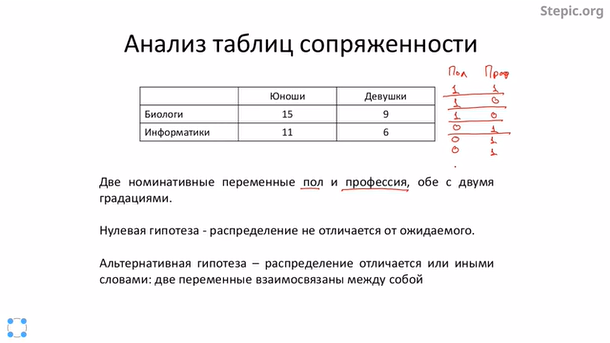

Н0 - две переменные не взаимосвязаны - наблюдаемые частоты не отличаются от ожидаемого распределения

Н1 - две переменные взаимосвязаны - эмпирическое распределение частот статистически значимо отличается от ожидаемого распределения

Пусть верна Н0 - заполняем ожидаемые значения. Ожидаемые значения... кря просто пересмотри если забыл

Сравниваем для каждой ячейке хи квадрат

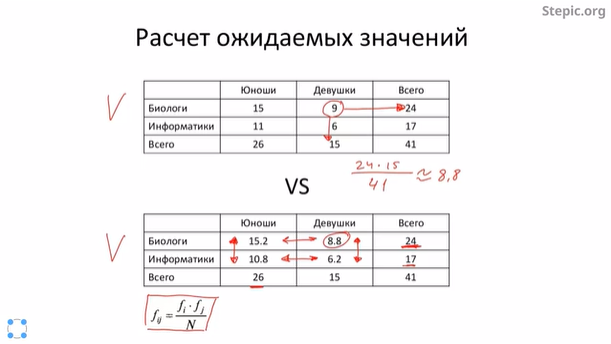

8.8 - ожидаемое количество девушек биологов

In [87]:
from scipy.stats.contingency import chi2_contingency

observ = ([10, 6], [5, 15])

chi2_contingency(observ) # последнее - ожидаемые значения в ячейках

Chi2ContingencyResult(statistic=3.715714285714286, pvalue=0.053902557169387154, dof=1, expected_freq=array([[ 6.66666667,  9.33333333],
       [ 8.33333333, 11.66666667]]))

In [88]:
from scipy.stats import chisquare

In [89]:
observ = ([15, 9], [11, 6])

chisquare(observ, chi2_contingency(observ)[-1])

Power_divergenceResult(statistic=array([0.00763575, 0.01323529]), pvalue=array([0.93036727, 0.90840965]))

### Поправка Йетса

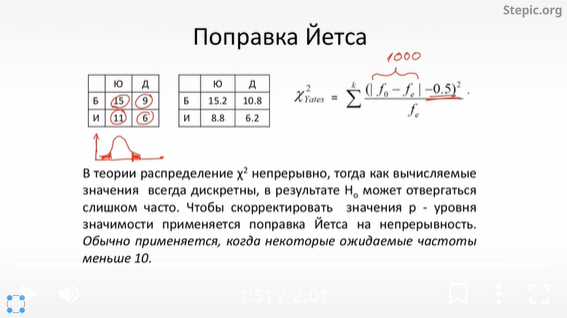

chi2_value, p_value, df_value, expected_array = stats.chi2_contingency(observed_array, correction=True) 

correction - и есть поправка йетса

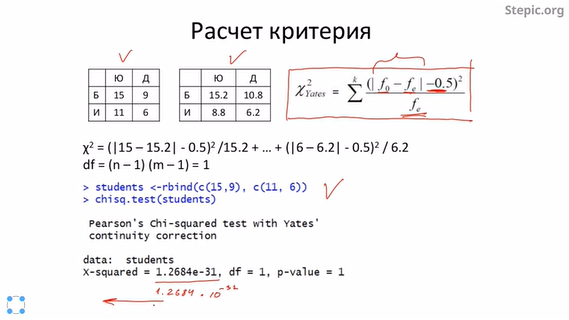

In [90]:
from scipy import stats
observed_array = [ [15, 9], [11, 6] ]
chi2_value, p_value, df_value, expected_array = stats.chi2_contingency(observed_array, correction=True) 
# 'correction=True' - поправка Йейтса
print(f'Хи-квадрат = {chi2_value:.3f}, p-value = {p_value:.3f}, df = {df_value}')
print(f'Ожидаемые значения:\n{expected_array}')

# p-valuer = 1 в данном случае значит что зависимости между полом и профессией нет

Хи-квадрат = 0.000, p-value = 1.000, df = 1
Ожидаемые значения:
[[15.2195122  8.7804878]
 [10.7804878  6.2195122]]


### Summary Хи квадрат

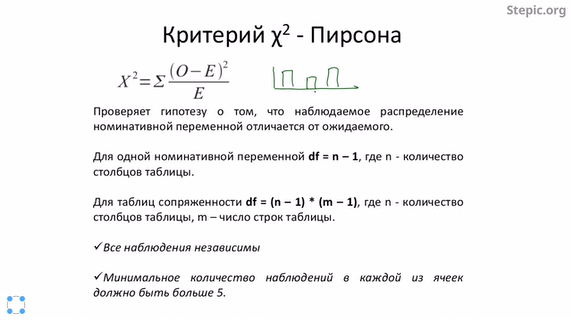

Хи квадрат не дает понимая где именно есть отклонение, он может только показат отклонятся ли наблюдаемое распределение от теоретичческого

### Задачи

In [91]:
observe = [[20, 15],
           [11, 12],
           [7, 9]]

chi2_value, p_value, df_value, expected_array = chi2_contingency(observe, correction=True)

print(f'Хи-квадрат = {chi2_value:.3f}, p-value = {p_value:.3f}, df = {df_value}')
print(f'Ожидаемые значения:\n{expected_array}')

Хи-квадрат = 0.954, p-value = 0.621, df = 2
Ожидаемые значения:
[[17.97297297 17.02702703]
 [11.81081081 11.18918919]
 [ 8.21621622  7.78378378]]


In [92]:
observe = [[18, 7],
           [6, 13]]

chi2_value, p_value, df_value, expected_array = chi2_contingency(observe, correction=True)

print(f'Хи-квадрат = {chi2_value:.3f}, p-value = {p_value:.3f}, df = {df_value}')
print(f'Ожидаемые значения:\n{expected_array}')

Хи-квадрат = 5.577, p-value = 0.018, df = 1
Ожидаемые значения:
[[13.63636364 11.36363636]
 [10.36363636  8.63636364]]


### Анализ остатков

Чтобы посмотреть где именно имеются отклонения применяется данный метод

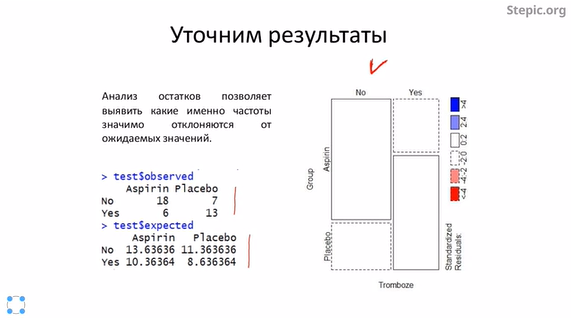

Ширина столбика - количество наблюдений

- размер прямоугольников  соответствует количеству наблюдений.
- цвет прямоугольников - величине значимости отклонения ожидаемых и наблюдаемых частот в этой ячейке.
- если значения стандартизированных остатков больше 3х, можно считать, что в этой ячейке зафиксированы значимые отклонения.

x-squared = 5.57719298245614
p-value = 0.018195864430772903
df = 1


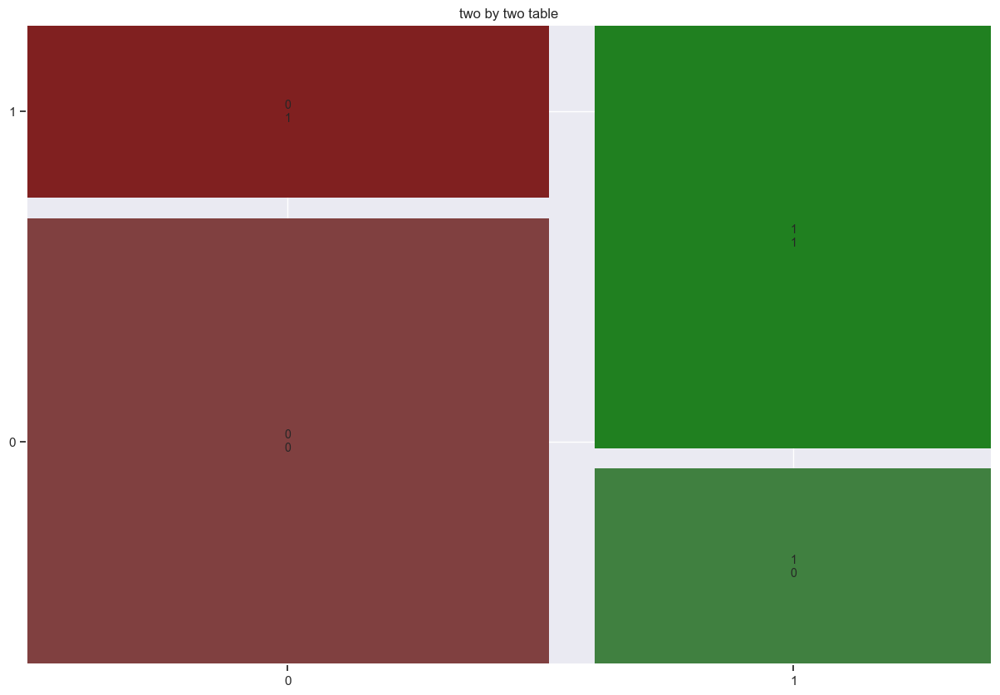

In [93]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic

observed = np.array([[18, 7], [6, 13]])

chi2, p, df, expected = stats.chi2_contingency(observed)

print('x-squared =', chi2)
print('p-value =', p)
print('df =', df)

mosaic(observed, gap=0.05, title='two by two table')

plt.show()

## Точный критерий фишера

Применяется когда не выполняются требования к данным для использования хи квадрата

Считаем вероятность получить тот случай который получился - в данном - вероятность получить такую табличку (ну и все что справа по распрределению)

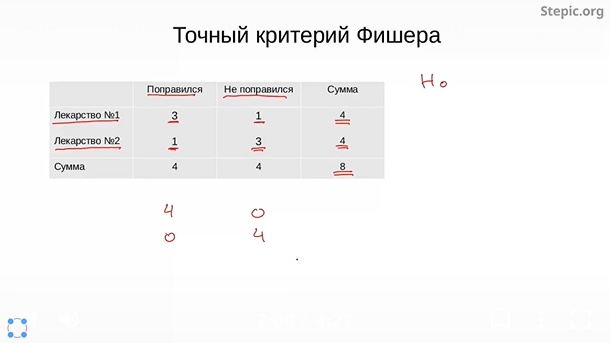

Для него п значение звучит как

какова вероятность получить а выздоровевших при том учете что всего выздоровило н

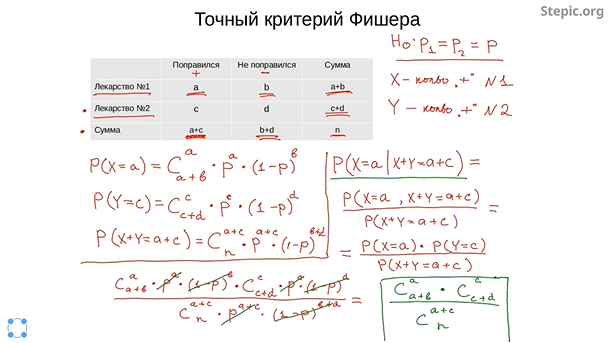

откуда видно что мы тестируем нулевую гипотезу - лекарство 1 и лекарство  влияют одинакого навыздоровление
т.е. двухсторонюю гипотезу (закрашиваем график с двух концов)

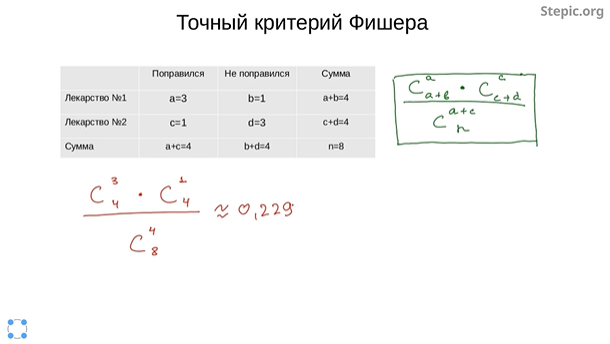
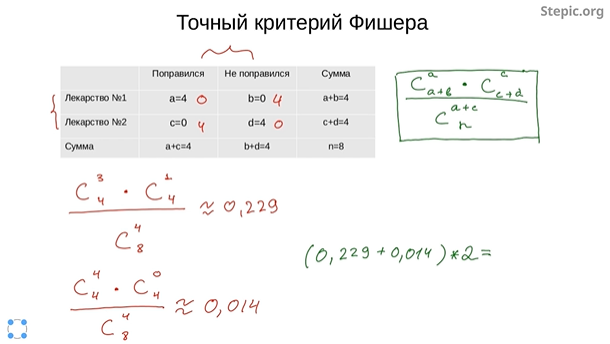

зеленое и есть п уровень значимости

In [94]:
from scipy.stats import fisher_exact

table = ((1, 3), (3, 1))

res = fisher_exact(table, alternative='two-sided') # greater, less
res.pvalue # что правильно

0.48571428571428565

# Логистическая регрессия

In [95]:
os.chdir(r'C:\Users\user\Юпитер')

## 0 предикторов
Предсказываем только интерцептом логарифм шансов выжить нового чувака основываясь только на колонке 'survived'

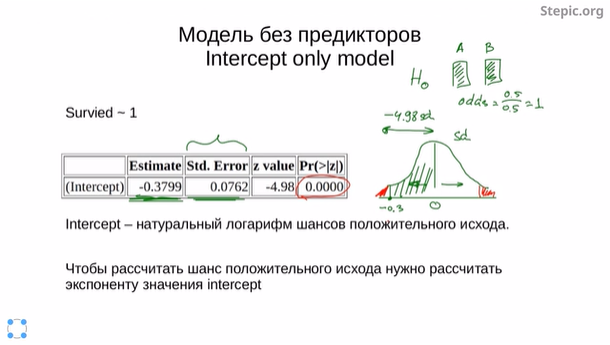

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats
 

df = pd.read_csv('titanic.csv')
df.Survived.value_counts()
np.log(342/549)
glm_binom2 = smf.glm(formula="Survived ~ 1",
                     data=df, family=sm.families.Binomial())
model = glm_binom2.fit()
model.summary()
# np.exp(-0.4732877044469254) / (1 + np.exp(-0.4732877044469254))
# coef - интерцепт
# P - з-мфдгуы
# Н0 - нет разницы между полож и отриц шансами
# std err - сколько стандартных отклонений между 0 и полученным результатои (см ЦПТ)
# z

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               Survived   No. Observations:                  891
Model:                            GLM   Df Residuals:                      890
Model Family:                Binomial   Df Model:                            0
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -593.33
Date:                Fri, 05 Apr 2024   Deviance:                       1186.7
Time:                        12:06:29   Pearson chi2:                     891.
No. Iterations:                     4   Pseudo R-squ. (CS):              0.000
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.4733      0.069     -6.870      0.000      -0.608      -0.338
==============================================================================
"""

## 1 предиктор

In [97]:
df = pd.read_csv('titanic.csv')
df.Survived.value_counts()
np.log(342/549)
glm_binom2 = smf.glm(formula="Survived ~ Sex",
                     data=df, family=sm.families.Binomial())
model = glm_binom2.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               Survived   No. Observations:                  891
Model:                            GLM   Df Residuals:                      889
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -458.90
Date:                Fri, 05 Apr 2024   Deviance:                       917.80
Time:                        12:06:29   Pearson chi2:                     891.
No. Iterations:                     4   Pseudo R-squ. (CS):             0.2605
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       1.0566      0.129      8.191      0.000       0.804       1.309
Sex[T.male]    -2.5137      0.167    -15.036      0.000      -2.841      -2.186
===============================================================================
"""

In [98]:
df.groupby(['Survived', 'Sex']).count()

Unnamed: 0  PassengerId  Pclass  Name  Age  SibSp  Parch  \
Survived Sex                                                                
0        female          81           81      81    81   64     81     81   
         male           468          468     468   468  360    468    468   
1        female         233          233     233   233  197    233    233   
         male           109          109     109   109   93    109    109   

                 Ticket  Fare  Cabin  Embarked  
Survived Sex                                    
0        female      81    81      6        81  
         male       468   468     62       468  
1        female     233   233     91       231  
         male       109   109     45       109

In [99]:
m_s, m_d, f_s, f_d = list(df.groupby(['Survived', 'Sex']).count()['Unnamed: 0'])

In [100]:
m_s, m_d, f_s, f_d

(81, 468, 233, 109)

In [101]:
odd_m = m_s / m_d
odd_f = f_s / f_d

In [102]:
odd_m, odd_f, np.log(odd_m), np.log(odd_f) # крч по идее логариф шенщин это интесцепт

(0.17307692307692307,
 2.1376146788990824,
 -1.754019141245208,
 0.7596905713365568)

In [103]:
odd_ratio = odd_m / odd_f# отношение шансов
np.log(odd_ratio) # откуда шшансы выжить для  мужчин значительно меньше

-2.5137097125817647

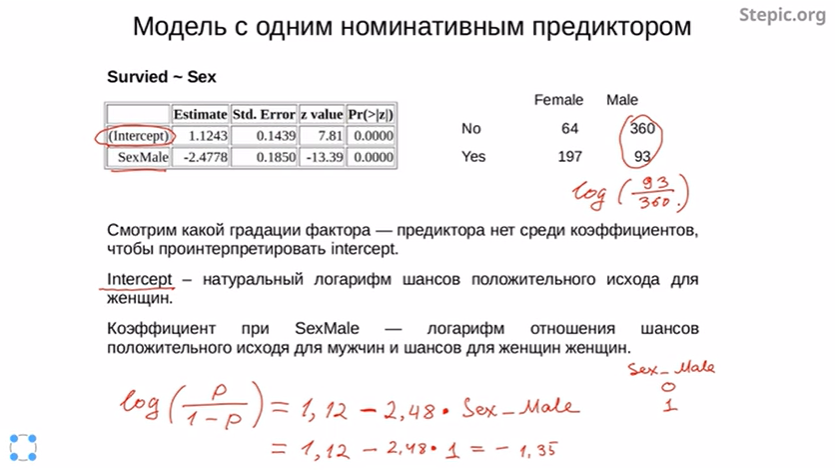

Интерцепт - базовая лог шанса для женщины
а интерцепт + estimete * 1 (т.е. 1 - мужчина) - то же,но для мужчины

Если градаций несколько, то они все (кроме однйо которая будет интерсептом) будут в табличке

Посмотреть важен ли предиктор можно сравнив качество модели (суть в том что остатки уменьшаться). Как сравнивать - в пень

## 2 предиктора

три гипотезы

Гипотеры о значимости предикторов и взаимосвязи предикторов

In [104]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.graphics.mosaicplot import mosaic

dataset = pd.read_csv('https://stepik.org/media/attachments/course/524/train.csv')

dataset["Sex"] = dataset["Sex"].replace("male", 1).replace("female", 0)
x = dataset[["Sex", "Pclass"]].values
y = dataset["Survived"].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=10)
model = LogisticRegression(n_jobs=1).fit(x_train, y_train)
y_predict = model.predict(x_test)
score = model.score(x_test, y_test)

mode = smf.logit(formula="Survived ~ C(Sex)*C(Pclass)", data=dataset).fit()
display(mode.summary())
plt.rcParams["figure.figsize"]=(12,8)
# mosaic(data, ["Survived", "Sex", "Pclass"], gap=0.02, title="Titanic Survived")
# plt.show() женщина 1 класса - интерсепт

Optimization terminated successfully.
         Current function value: 0.447866
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               Survived   No. Observations:                  891
Model:                          Logit   Df Residuals:                      885
Method:                           MLE   Df Model:                            5
Date:                Fri, 05 Apr 2024   Pseudo R-squ.:                  0.3274
Time:                        12:06:30   Log-Likelihood:                -399.05
converged:                       True   LL-Null:                       -593.33
Covariance Type:            nonrobust   LLR p-value:                 8.670e-82
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      3.4122      0.587      5.815      0.000       2.262       4.562
C(Sex)[T.1]                   -3.9494      0.616     -6.411      0.000      -5.157      -2.742
C(Pclass)[T.2]                -0.9555      0.725     -1.318      0.187      -2.376       0.465
C(Pclass)[T.3]                -3.4122      0.610     -5.594      0.000      -4.608      -2.217
C(Sex)[T.1]:C(Pclass)[T.2]    -0.1850      0.794     -0.233      0.816      -1.741       1.371
C(Sex)[T.1]:C(Pclass)[T.3]     2.0958      0.657      3.189      0.001       0.808       3.384
==============================================================================================
"""

Как видно между первым и вторм классом для женщин разница мала

Кря, в множественной регресии взаимодействие факторов считается как
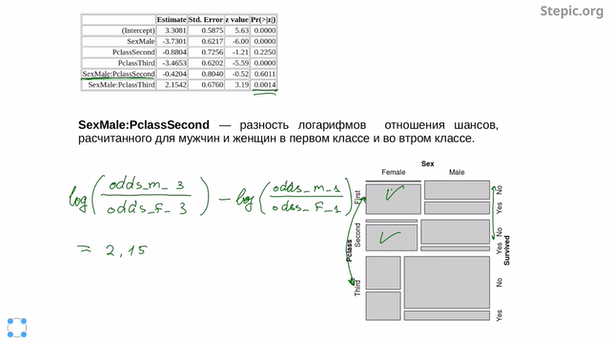

Для непрерывных предикторов в интерцепт вписывается ситуация с непрерыным предитором = 0. в стлбиче coef значение которое изменяетс при изменении такого предиктора на 1

Intercept – логарифм шансов положительного исхода для женщин в первом классе.

SexMale — логарифм отношения шансов для мужчин в первом классе и женщин в первом классе.

PclassSecond — логарифм отношения шансов для женщин во втором классе и женщин в первом классе.

PclassThird — логарифм отношения шансов для женщин в третьем классе и женщин в первом классе.

SexMale:PclassSecond — разность логарифмов отношения шансов, рассчитанного для мужчин и женщин в первом классе и во втором классе.

SexMale:PclassThird — разность логарифмов отношения шансов рассчитанного для мужчин и женщин в первом и в третьем классе.

## Когда использовать непараметрические тесты

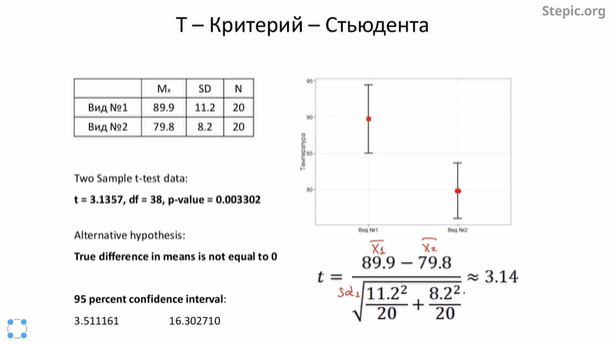
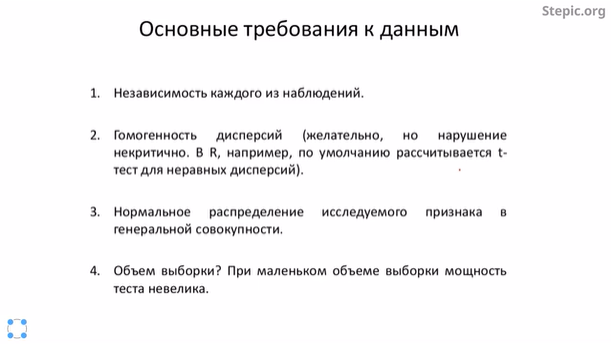
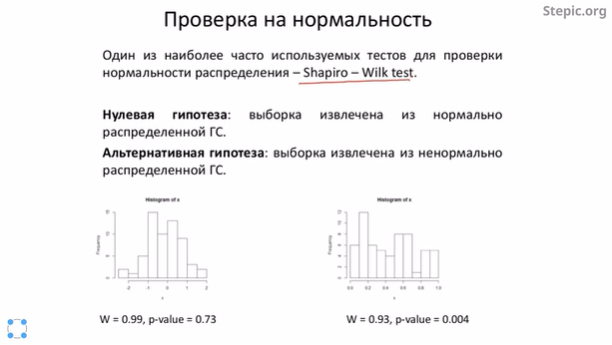

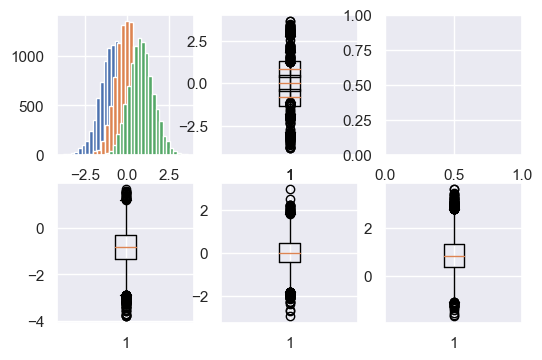

In [110]:
n = 3

y = np.random.normal(0, 1, (10000, n))
y = np.sort(y, axis = 1)

fig, ax = plt.subplots(2, 3, figsize=(6, 4))
mean_num = [0 for _ in range(n)]
for i in range(n):
    ax[0, 0].hist(y[:, i], bins=25)#, range(10000))
    mean_num[i] = y[:, i].mean()
    ax[0, 1].boxplot(y[:, i])#, range(10000))
for i in range(n):
    ax[1, i].boxplot(y[:, i])#, range(10000))
# mean_num

## Непараметрические методы

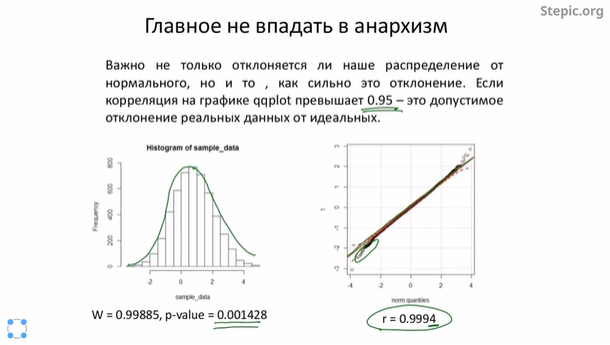

Cамым популярным непараметрическим критерием для сравнения двух групп является U-критерий Манна — Уитни. Логика данного критерия заключается в том, что вместо сравнения средних значений в двух выборках критерий сравнивает сумму рангов (не медианы, как многие думают). Мы сначала упорядочиваем все данные, затем рассчитываем сумму рангов в каждой из групп.

 Затем для каждой из выборок рассчитывается показател




 
 ь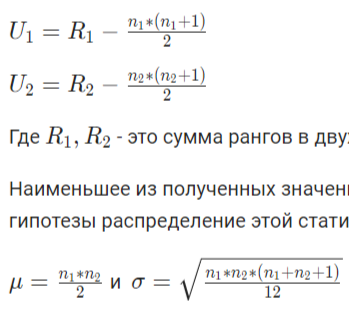

то сумма рангов в двух группах, а 
�
1
,
�
2
n 
1
​
 ,n 
2
​
  - число наблюдений.

Наименьшее из полученных значений и выступает в качестве статистики теста. Легко показать, что при условии ве
​
 ∗n 
2
​
 
​
  и  
�
=
�
1
∗
�
2
∗
(
�
1
+
�
2
+
1
)
12
σ= 
12
n 
1
​
 ∗n 
2
​
 ∗(n 
1
​
 +n 
2
​
 +1)
​
 
​
  

что и позволяет нам рассчитать вероятность получить наблюдаемые или еще более выраженные различия суммы рангов.

Разумно применять вместо t - теста: 

Распределения хотя бы в одной из выборок значительно отличается от нормального. 
Есть заметные выбросы в данных. 
В некоторых задачах мощность теста даже выше, чем t критерия (например, когда обеих выборках наблюдается заметная асимметрия в одинаковом направлении). 
Неразумно применять: 

Выборки разного размера, с различным направлением асимметрии.  

## Картаметодов map

T-test - критерий Мона Уитни

Дисперсионный анализ - критерий Краскела - Уоллиса

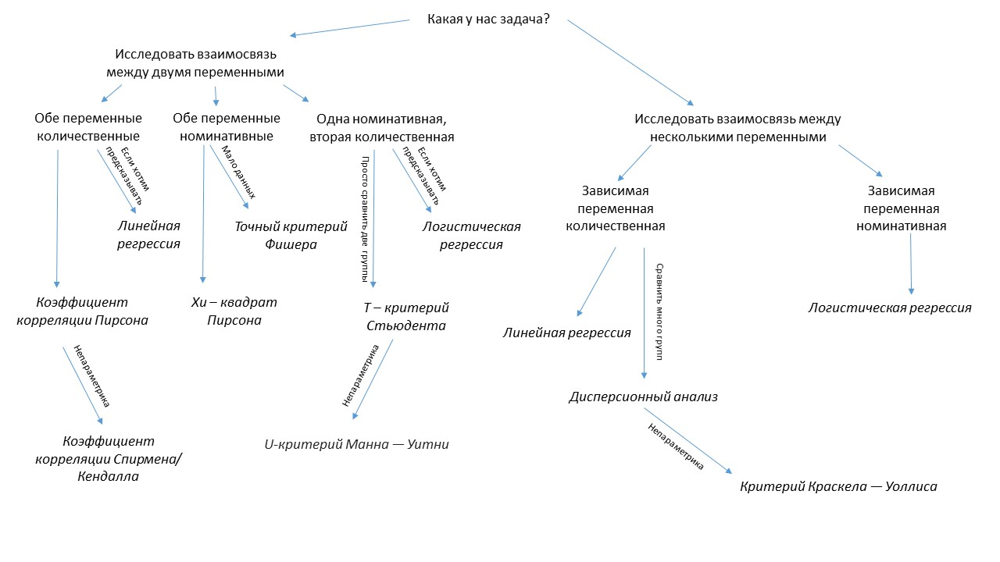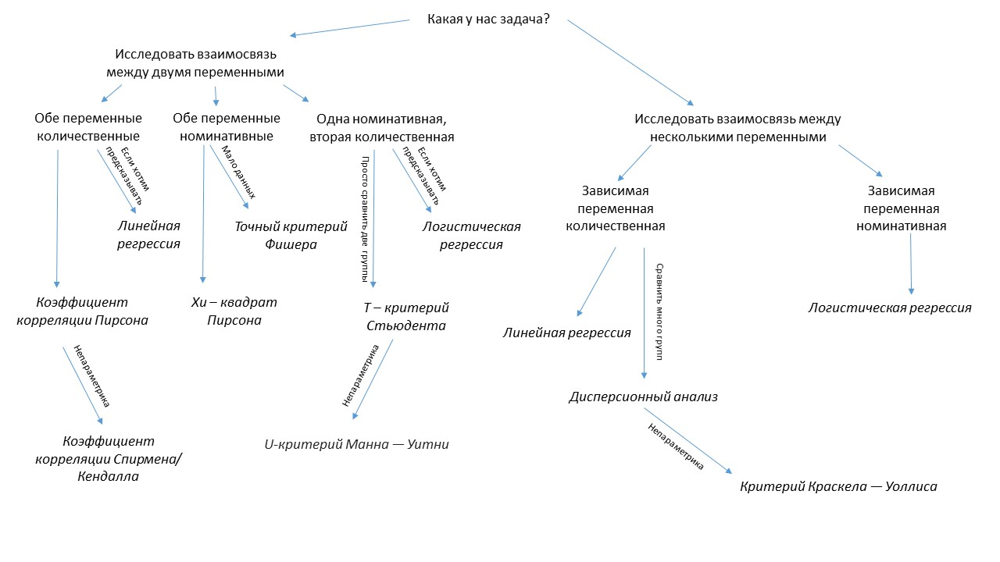

https://yatani.jp/teaching/doku.php?id=hcistats:start

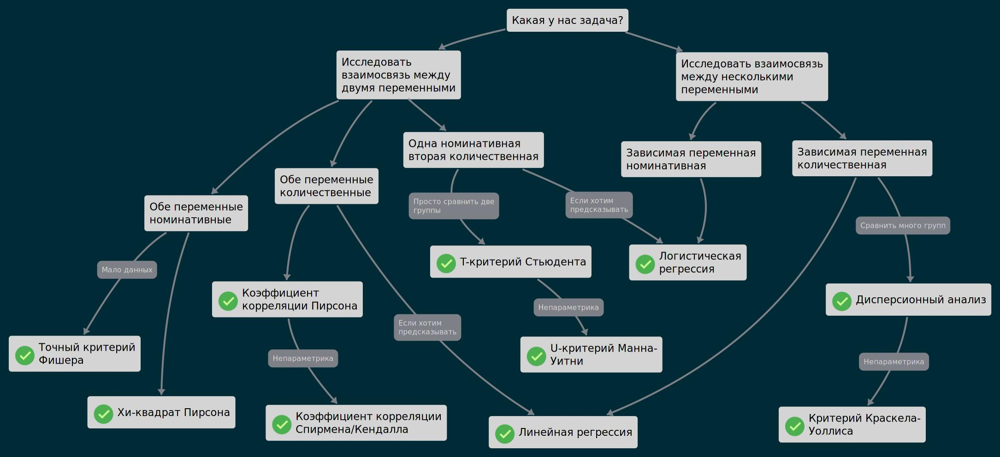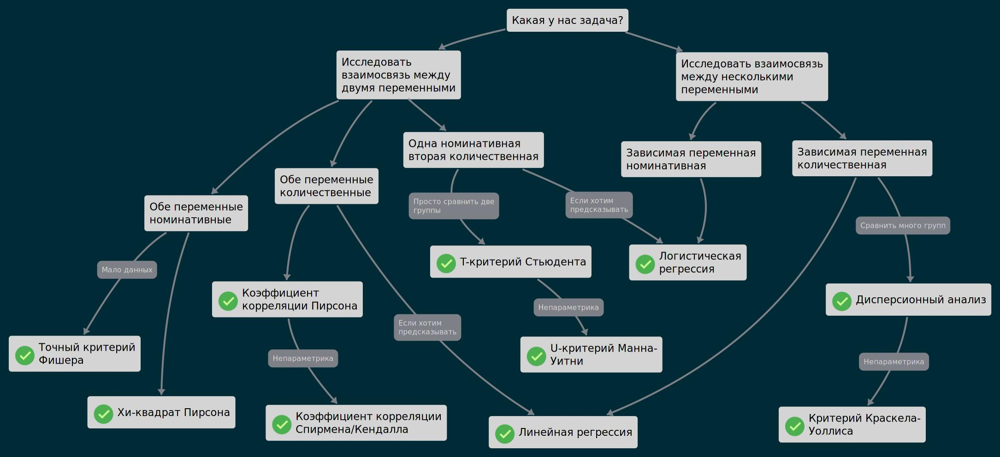

# Кластерный аализ и метод главных компонент

Кластерный анализ - группировка искомой переменной

Метод главных команент - группировка переменных

К-средних - задаем количество кластеров. Метод бросает в рандомных местах центроиды - они находятя как средее - и находим расстояния своих наблюдений для центроидов - свое наблюдения если оно ближе всего к определенному центроиду - 

In [1]:
# import numpy as np
import matplotlib.pyplot as plt


class K_Means:
    colors = ("red", "blue", "green", "gold", "silver", "purple", "pink", "orange", "black")
    def __init__(self, x, y, k):
        if len(x) != len(y):
            raise ValueError("Длины векторов не совпадают!")
        self.x = x
        self.y = y 
        self.k = k
        self.groups = [[]]
        i = np.random.randint(0, len(x)-1)
        self.centroids = [(x[i], y[i])]
        for _ in range(k-1):
            self.groups.append([])
            dist = []
            for i in range(len(x)):
                dist.append(min( self.distance(c[0], c[1], x[i], y[i]) for c in self.centroids ))
            indx = dist.index(max(dist))
            self.centroids.append((x[indx], y[indx]))

    def distance(self, x1, y1, x2, y2):
        return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

    def get_groups(self):
        f = True
        while f:
            for k in range(self.k):
                group = []
                for i in range(len(self.x)):
                    d = self.distance(self.centroids[k][0], self.centroids[k][1], self.x[i], self.y[i])
                    if all(d <= self.distance(self.centroids[j][0], self.centroids[j][1], self.x[i], self.y[i]) for j in range(self.k) if j != k):
                        group.append((self.x[i], self.y[i]))
                self.groups[k] = group
                if len(group):
                    new_centroid = tuple(np.mean(group, axis = 0))
                    if new_centroid != self.centroids[k]:
                        self.centroids[k] = new_centroid
                        f = True
                    else:
                        f = False
        return self.groups

    def show(self):
        coords = self.get_groups()
        colors = self.colors
        for i in range(len(coords)):
            x = []
            y = []
            for j in range(len(coords[i])):
                x.append(coords[i][j][0])
                y.append(coords[i][j][1])
            plt.scatter(x, y, color = colors[i % len(colors)])
        plt.show()

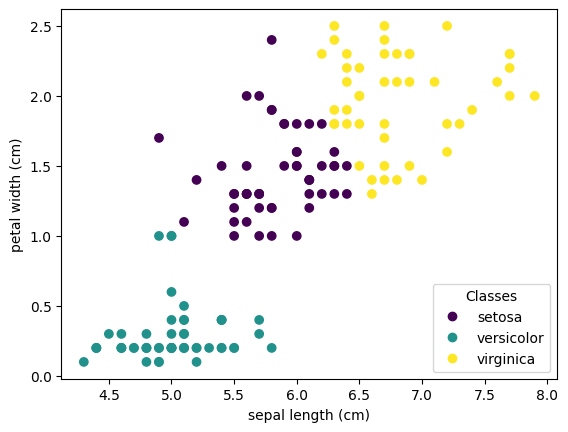

In [1]:
from sklearn import datasets
from sklearn import cluster
import matplotlib.pyplot as plt
# загрузка датасета
iris = datasets.load_iris()
# инициализация алгоритма
kmeans = cluster.KMeans(n_clusters=3, random_state=1, n_init="auto")
# обучение на столбцах 'sepal length' и 'petal width'
kmeans.fit(iris.data[:, (0, 3)])
# получение лейблов
iris_labels = kmeans.labels_
# отрисовка графики
_, ax = plt.subplots()
scatter = ax.scatter(iris.data[:, 0], iris.data[:, 3], c=iris_labels)
ax.set(xlabel=iris.feature_names[0], ylabel=iris.feature_names[3])
_ = ax.legend(
    scatter.legend_elements()[0], iris.target_names, loc="lower right", title="Classes"
)

## Как определить число кластеров
Определять это будем по внутригрупповой сумме квадратов (квадрат расстояния от членов кластера до ядра) и общей внутригрупповой сумме квадратов (сумма всех внутригрупповых)

Будем менять число кластеров. Идея в том, что если добавление нового кластера значительно понижает общую сумму квадратов, то увеличение числа кластеров имеет смысл

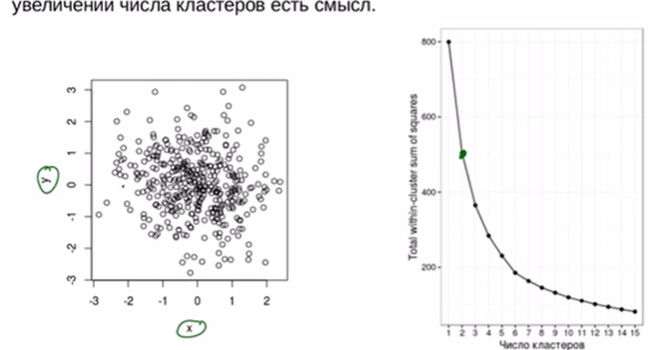

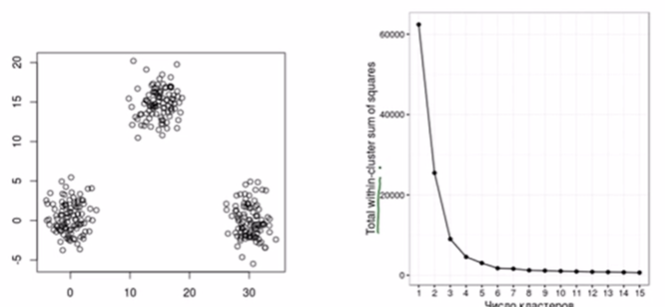

## Иерархическая кластеризация
Сначала рассчитываются расстояния между точками, потмо все постепенно объединяется

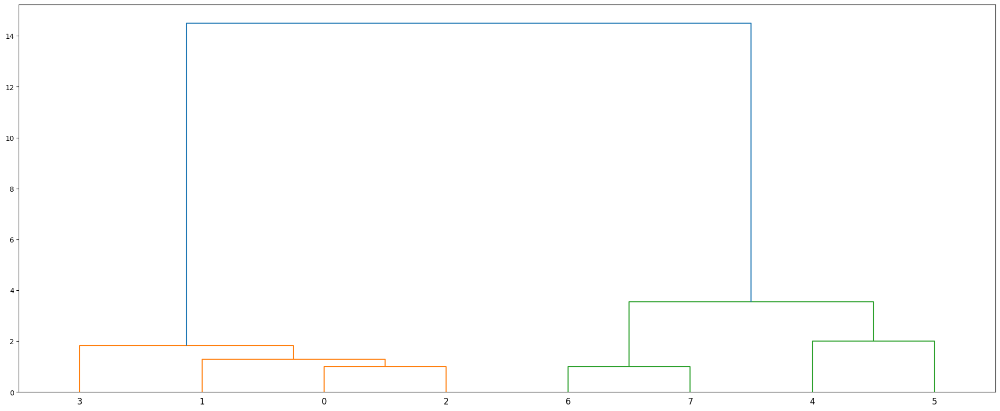

In [2]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt
import numpy as np

# Для прорисовки графики
%matplotlib inline

# Наши данные
points = np.array([[1,2], [2,1], [2,2], [1,3], [6,7], [6,5], [7,8], [8,8]], dtype=float)

Z = linkage(points, 'ward')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)


## Метод главных компанент
Меняем оси

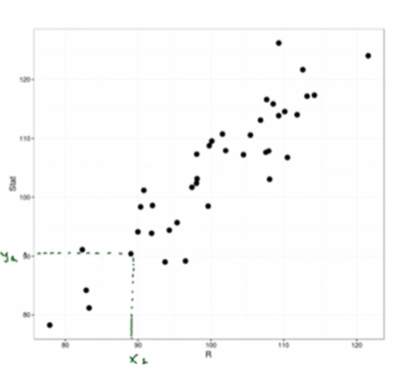

Аля провели регрессионный анализ, получили палку и теперь эту палку будем считаь новой фичей

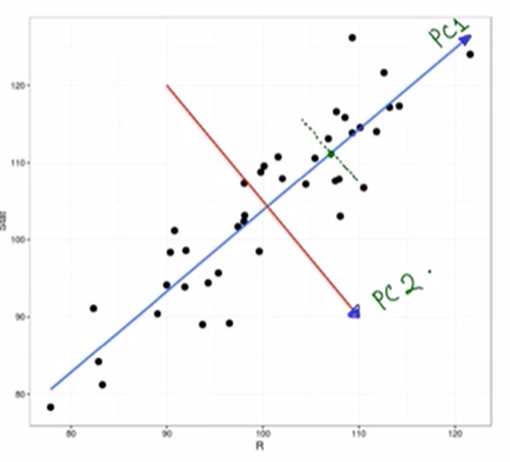

На следующем графике показано сколько дисперсии (изменчивости) объясняет каждая компанента

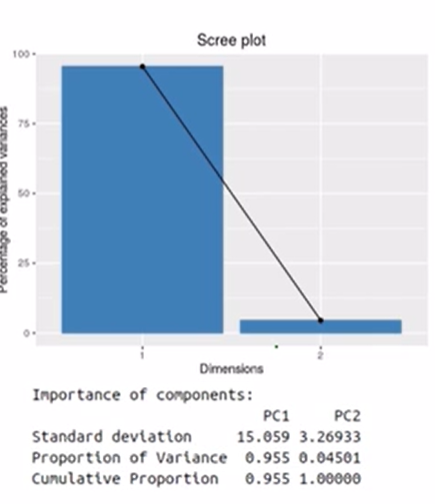

Биплот

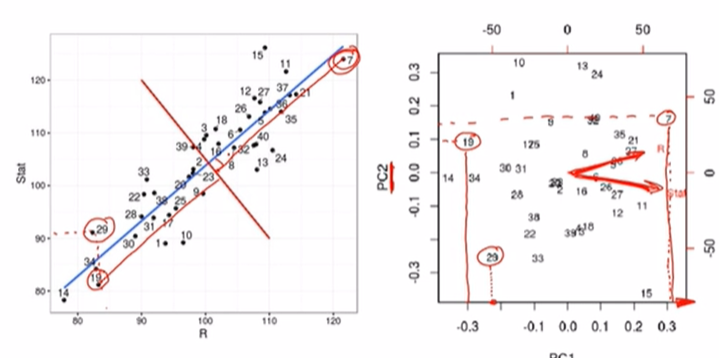

Угол между R и stat показывает корреляцию между ними

### Чуть факторного анализа

Факторный анализ - метод понижения размерности данных. Идея метода заключается в том, что возможно некоторые переменные могут быть сгруппированы в факторы. Фактор - это некоторая латентная переменная, которая объединяет исходные переменные в данных.

Например, если бы в нашей выборке каждый испытуемый характеризовался весом, ростом, силой, знаем английского, знанием немецкого и знанием русского языка. То вероятно, мы смогли бы выделить два фактора: "физическая подготовка" и "знание языков". Разумеется, первые три определяли бы первый фактор, а оставшиеся переменные - второй  фактор.

Давайте посмотрим на основные результаты факторного анализа, примененного к нашим данным swiss для того, чтобы выделить два фактора:

Image: https://ucarecdn.com/0f7b065a-ace4-43bd-941c-0e91ee39324e/-/crop/302x172/0,0/-/pre








Основные результаты факторного анализа - это факторные нагрузки для каждой переменной. Проводя аналогии с анализом главных компонент, мы можем выяснить какие переменные в большей степени взаимосвязаны между собой и влияют на значения первого фактора, а какие переменные напротив группируются друг с другом и влияют на второй фактор.

В данной таблице видно, что первый фактор - это низкие значения по переменной Fertility, Agriculture но высокие значения переменных Examination и Education. Второй фактор - это наоборот высокие значения по переменным  Fertility, Agriculture, низкие по переменной Examination и максимальный вклад вносит переменная Catholic - то есть процент католического населения.

Таким образом, можно предположить, что за факторизацию наших переменных отвечает два фактора - преобладание протестантского или католического населения.

In [151]:
%matplotlib tk

In [157]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kstest, shapiro, gaussian_kde
from scipy import stats

#Задача 1
'''
Мы измерили рост 100 людей. Нужно проверить, распределен ли рост людей равномерно? (т.е. людей с ростом 1.5 столько же сколько и с ростом 1.7)
Н0 - распределение роста людей равномерное
Н1 - распределение роста людей отличается от равномерного
установим p-value=0.005 - вероятность получить полученные отклонения или еще более выраженные отклонения
'''

measurements = np.random.normal(1.75, 0.2, 100) # нагенерировал нормальным распределением 100 замеров
kernel = gaussian_kde(measurements)
pdf = [kernel(x) for x in np.linspace(1.2, 2.2, 100)]

lst = list()
for x in pdf:
    lst.append(x[0])
pdf2 = np.array(lst)
# pdf2 = stats.zscore(pdf2)
f, ax = plt.subplots(1, 2)
ax[0].hist(measurements, bins=10)
ax[0].set_xlabel('рост людей, m')
ax[0].set_ylabel('частота')
ax[0].set_title('Гистограмма по результатам опыта')
ax[0].grid()
ax[1].plot(pdf2)
ax[1].set_title('плотность распределения вероятности из опыта (но я где обкекался)')
ax[1].grid()

In [158]:
# Теперь посмотрим на равномерное распределение
fig = plt.figure()
ax = fig.add_subplot()
ax.hist([np.linspace(0, 10, 10)], bins=10)
ax.set_ylim([0, 3])
ax.grid()
ax.set_title('Равномерное распределение')
print()

In [149]:
# теперь рассчитаем p-значение - вероятность получить распределение как в опыте если считать, что генеральная совокупность распределена нормально (рост людей распределен нормально)
print(f'p-value= {kstest(stats.zscore(measurements), stats.uniform.cdf)[1]}')

p-value= 1.200749492950502e-24
